# Insurance Claim Fraud Detection

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import zipfile
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('https://raw.githubusercontent.com/FlipRoboTechnologies/ML_-Datasets/main/Insurance%20Claim%20Fraud%20Detection/Automobile_insurance_fraud.csv', )
df

,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES.1,71610,6510,13020,52080,Saab,92x,2004,Y
0,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
1,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
2,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
3,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
4,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
995,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
996,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
997,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [3]:
df.columns= ['months_as_customer', 'age', 'policy_number', 'policy_bind_date', 'policy_state', 'policy_csl', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'capital-gains', 'capital-loss', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'property_damage', 'bodily_injuries', 'witnesses', 'police_report_available', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make', 'auto_model', 'auto_year', 'fraud_reported']
df           
             

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
1,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
2,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
3,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
4,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
995,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
996,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
997,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [4]:
df.shape

(999, 39)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           999 non-null    int64  
 1   age                          999 non-null    int64  
 2   policy_number                999 non-null    int64  
 3   policy_bind_date             999 non-null    object 
 4   policy_state                 999 non-null    object 
 5   policy_csl                   999 non-null    object 
 6   policy_deductable            999 non-null    int64  
 7   policy_annual_premium        999 non-null    float64
 8   umbrella_limit               999 non-null    int64  
 9   insured_zip                  999 non-null    int64  
 10  insured_sex                  999 non-null    object 
 11  insured_education_level      999 non-null    object 
 12  insured_occupation           999 non-null    object 
 13  insured_hobbies     

In [6]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

In [7]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [8]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
1,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
2,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
3,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
4,256,39,104594,12-10-2006,OH,250/500,1000,1351.10,0,478456,...,2,NO,64100,6410,6410,51280,Saab,95,2003,Y


In [9]:
# List object variables
object_vars = df.select_dtypes(include='object').columns.tolist()
print(f"Object/Categorical variables:\n{object_vars}\n")

# List int64 variables
int_vars = df.select_dtypes(include='int64').columns.tolist()
print(f"int64 variables:\n{int_vars}\n")

# List float64 variables
float_vars = df.select_dtypes(include='float64').columns.tolist()
print(f"float64 variables:\n{float_vars}")

Object/Categorical variables:
['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']

int64 variables:
['months_as_customer', 'age', 'policy_number', 'policy_deductable', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']

float64 variables:
['policy_annual_premium']


In [10]:
# checking the null values
missing_val = df.isnull().sum().to_frame("Null values")

# Calculate the % of the null values
missing_val["% of missing"] = round(missing_val['Null values'] / len(df) * 100,2)
missing_val = missing_val.sort_values(by='% of missing', ascending=False)

missing_val

,Null values,% of missing
months_as_customer,0,0.0
witnesses,0,0.0
incident_state,0,0.0
incident_city,0,0.0
incident_location,0,0.0
incident_hour_of_the_day,0,0.0
number_of_vehicles_involved,0,0.0
property_damage,0,0.0
bodily_injuries,0,0.0
police_report_available,0,0.0


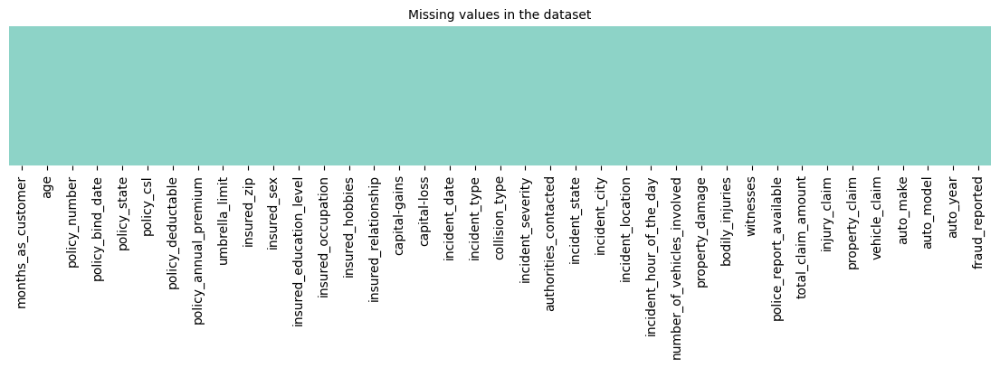

In [11]:
# Let's visualize it using heatmap for dataset
plt.figure(figsize=(14,2))
sns.heatmap(df.isnull(), yticklabels=False, cmap='Set3', cbar=False)
plt.title('Missing values in the dataset', fontsize=10);

In [12]:
# Reviewing the number of unique values in each feature and the target
info_df = df.nunique().to_frame('No. of Unique values')
info_df['type'] = df.dtypes.values

info_df

,No. of Unique values,type
months_as_customer,391,int64
age,46,int64
policy_number,999,int64
policy_bind_date,950,object
policy_state,3,object
policy_csl,3,object
policy_deductable,3,int64
policy_annual_premium,990,float64
umbrella_limit,11,int64
insured_zip,994,int64


In [13]:
# Checking for columns with one unique value or have the same unique values as rows has the dataset
info_df[(info_df['No. of Unique values'] == 1) | (info_df['No. of Unique values'] == df.shape[0]) ]

,No. of Unique values,type
policy_number,999,int64
incident_location,999,object


In [14]:
# Checking insured_zip column
df['insured_zip'].value_counts()

477695    2
469429    2
431202    2
446895    2
456602    2
         ..
476303    1
450339    1
476502    1
600561    1
612260    1
Name: insured_zip, Length: 994, dtype: int64

In [15]:
df[['policy_number', 'incident_location', 'insured_zip']].sample(5)

,policy_number,incident_location,insured_zip
618,831479,3592 MLK Ridge,461418
726,691115,4782 Sky Lane,431202
824,569245,2820 Britain St,439360
601,110084,8704 Britain Lane,612660
882,569714,1472 4th Drive,479824


The policy_number and incident_location columns have the same unique values as the dataset rows. These columns solely serve to identify each record and do not influence the target variable. Therefore, they can be dropped.

The insured_zip represents the zip code where the insurance was made. Since it nearly mirrors the number of rows in the dataset, this feature does not provide valuable information for the prediction model and can be dropped as well.

In [16]:
# List of categorical variables
info_df[(info_df['type'] == 'object') & (info_df.index != 'incident_location')]

,No. of Unique values,type
policy_bind_date,950,object
policy_state,3,object
policy_csl,3,object
insured_sex,2,object
insured_education_level,7,object
insured_occupation,14,object
insured_hobbies,20,object
insured_relationship,6,object
incident_date,60,object
incident_type,4,object


In [17]:
# List of numerical variables
info_df[(info_df['type'] == 'int64') | (info_df['type'] == 'float64')].sort_values(by='No. of Unique values')

,No. of Unique values,type
policy_deductable,3,int64
bodily_injuries,3,int64
witnesses,4,int64
number_of_vehicles_involved,4,int64
umbrella_limit,11,int64
auto_year,21,int64
incident_hour_of_the_day,24,int64
age,46,int64
capital-gains,338,int64
capital-loss,354,int64


In [18]:
# Dropping the columns policy_number and incident_location
df.drop(['policy_number', 'incident_location', 'insured_zip'], axis=1, inplace=True)
display(df.sample(5))

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
888,191,38,20-11-2005,IL,100/300,2000,1253.44,0,FEMALE,Masters,...,0,NO,56320,10240,5120,40960,Volkswagen,Jetta,2007,N
356,110,28,13-07-2013,OH,250/500,1000,1573.93,0,MALE,College,...,2,?,65040,10840,10840,43360,Suburu,Impreza,2010,N
983,163,36,27-01-2000,IN,250/500,1000,1503.21,0,MALE,MD,...,1,NO,51390,5710,11420,34260,Toyota,Corolla,2013,N
253,20,23,01-05-1999,OH,500/1000,1000,1711.72,0,FEMALE,JD,...,2,NO,63250,5750,11500,46000,Chevrolet,Tahoe,2002,Y
358,292,44,28-02-1997,OH,500/1000,500,1097.57,0,MALE,PhD,...,0,YES,61700,6170,6170,49360,Saab,93,2005,N


In [19]:
# checking the new dimension of the dataset
print(f"The rows and columns in the dataset: {df.shape}")

The rows and columns in the dataset: (999, 36)


In [20]:
# Checking the target variable
df['fraud_reported'].value_counts().to_frame()

,fraud_reported
N,753
Y,246


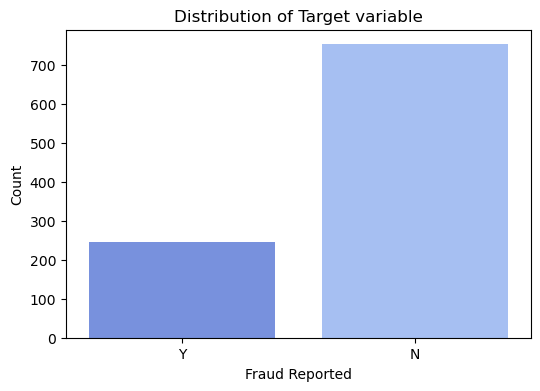

In [21]:
# Visualize the distribution of fraud_reported
col = 'fraud_reported'
plt.figure(figsize=(6, 4))
sns.set_palette('coolwarm')
ax = sns.countplot(data=df, x=col)

plt.title('Distribution of Target variable')
plt.xlabel('Fraud Reported')
plt.ylabel('Count')
plt.show()

In [22]:
# Separating Numerical and Categorical columns
categorical_col =  df.select_dtypes(include='object').columns.tolist()
num_cat_col = ['policy_deductable', 'bodily_injuries', 'witnesses', 'number_of_vehicles_involved', 'umbrella_limit', 'auto_year', 'incident_hour_of_the_day', 'age']
numerical_col =  [col for col in df.select_dtypes(include=np.number).columns.tolist() if col not in num_cat_col]

#  Numerical and Categorical columns
print(f"Categorical Columns:\n {categorical_col}\n")
print(f"Numerical Columns that represent a category:\n {num_cat_col}\n")
print(f"Numerical Columns:\n {numerical_col}\n")

Categorical Columns:
 ['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']

Numerical Columns that represent a category:
 ['policy_deductable', 'bodily_injuries', 'witnesses', 'number_of_vehicles_involved', 'umbrella_limit', 'auto_year', 'incident_hour_of_the_day', 'age']

Numerical Columns:
 ['months_as_customer', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim']



In [23]:
# Checking the value counts of the categorical independent variables
for i, col in enumerate(categorical_col[:-1]):
    print(f"{i+1}. {col}:\n{df[col].value_counts()}")
    print(f"No. uniques values: {df[col].nunique()}\n")

1. policy_bind_date:
05-08-1992    3
01-01-2006    3
28-04-1992    3
09-08-2004    2
09-03-2003    2
             ..
12-12-1998    1
18-02-1999    1
30-10-1997    1
29-11-1999    1
11-11-1996    1
Name: policy_bind_date, Length: 950, dtype: int64
No. uniques values: 950

2. policy_state:
OH    351
IL    338
IN    310
Name: policy_state, dtype: int64
No. uniques values: 3

3. policy_csl:
250/500     350
100/300     349
500/1000    300
Name: policy_csl, dtype: int64
No. uniques values: 3

4. insured_sex:
FEMALE    537
MALE      462
Name: insured_sex, dtype: int64
No. uniques values: 2

5. insured_education_level:
JD             161
High School    160
Associate      145
MD             143
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64
No. uniques values: 7

6. insured_occupation:
machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         73
transport-movi

These are the unique values for the categorical independent variables.

The policy_bind_datd and incident_date columns should be transformed to date.

The collision_type, property_damage, and police_report_available columns despite not having null values, have a value as '?' which is equivalent to a null value, which we will handle later.

In [24]:
# Checking the value counts of the Numerical Columns that represent a category:
for i, col in enumerate(num_cat_col):
    print(f"{i+1}. {col}:\n{df[col].value_counts()}")
    print(f"No. uniques values: {df[col].nunique()}\n")

1. policy_deductable:
1000    350
500     342
2000    307
Name: policy_deductable, dtype: int64
No. uniques values: 3

2. bodily_injuries:
0    340
2    332
1    327
Name: bodily_injuries, dtype: int64
No. uniques values: 3

3. witnesses:
1    258
0    249
2    249
3    243
Name: witnesses, dtype: int64
No. uniques values: 4

4. number_of_vehicles_involved:
1    580
3    358
4     31
2     30
Name: number_of_vehicles_involved, dtype: int64
No. uniques values: 4

5. umbrella_limit:
 0           797
 6000000      57
 5000000      46
 4000000      39
 7000000      29
 3000000      12
 8000000       8
 9000000       5
 2000000       3
 10000000      2
-1000000       1
Name: umbrella_limit, dtype: int64
No. uniques values: 11

6. auto_year:
1995    56
1999    55
2005    54
2006    53
2011    53
2007    52
2003    51
2010    50
2009    50
2002    49
2013    49
2015    47
2012    46
1997    46
2008    45
2014    44
2000    42
2001    42
1998    40
2004    38
1996    37
Name: auto_year, dtype:

In [25]:
print(f"% of zeros in umbrella_limit column is {df['umbrella_limit'].value_counts(normalize=True)[0]*100:.2f}%")

% of zeros in umbrella_limit column is 79.78%


In [26]:
# Checking the value counts of the numerical independent variables
for i, col in enumerate(numerical_col):
    print(f"{i+1}. {col}:\n{df[col].value_counts()}")
    print(f"No. uniques values: {df[col].nunique()}\n")

1. months_as_customer:
194    8
230    7
140    7
101    7
128    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64
No. uniques values: 391

2. policy_annual_premium:
1362.87    2
1281.25    2
1524.45    2
1374.22    2
1558.29    2
          ..
1437.33    1
988.29     1
1238.89    1
1384.64    1
766.19     1
Name: policy_annual_premium, Length: 990, dtype: int64
No. uniques values: 990

3. capital-gains:
0        508
46300      5
51500      4
68500      4
56700      3
        ... 
36700      1
54900      1
69200      1
48800      1
50300      1
Name: capital-gains, Length: 338, dtype: int64
No. uniques values: 338

4. capital-loss:
 0        474
-31700      5
-53700      5
-50300      5
-45300      4
         ... 
-12100      1
-17000      1
-72900      1
-19700      1
-82100      1
Name: capital-loss, Length: 354, dtype: int64
No. uniques values: 354

5. total_claim_amount:
59400    5
4320     4
58500    4
5940     4
2640     4

In [27]:
print(f"% of zeros in capital-gains column is {df['capital-gains'].value_counts(normalize=True)[0]*100:.2f}%")
print(f"% of zeros in capital-loss column is {df['capital-loss'].value_counts(normalize=True)[0]*100:.2f}%")

% of zeros in capital-gains column is 50.85%
% of zeros in capital-loss column is 47.45%


In [28]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,999.000000,999.000000,999.000000,999.000000,9.990000e+02,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000,999.000000
mean,203.829830,38.938939,1136.136136,1256.255495,1.102102e+06,25097.897898,-26820.520521,11.650651,1.839840,0.991992,1.486486,52743.073073,7434.344344,7393.943944,37914.784785,2005.104104
std,115.103809,9.140370,612.155989,244.243187,2.298293e+06,27871.869471,28105.366259,6.951671,1.019044,0.820538,1.111773,26408.011569,4883.309038,4823.859773,18890.397013,6.018773
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,0.000000,-111100.000000,0.000000,1.000000,0.000000,0.000000,100.000000,0.000000,0.000000,70.000000,1995.000000
25%,115.500000,32.000000,500.000000,1089.185000,0.000000e+00,0.000000,-51500.000000,6.000000,1.000000,0.000000,1.000000,41775.000000,4290.000000,4440.000000,30275.000000,2000.000000
50%,199.000000,38.000000,1000.000000,1257.040000,0.000000e+00,0.000000,-24100.000000,12.000000,1.000000,1.000000,1.000000,57970.000000,6780.000000,6750.000000,42080.000000,2005.000000
75%,276.000000,44.000000,2000.000000,1415.710000,0.000000e+00,51000.000000,0.000000,17.000000,3.000000,2.000000,2.000000,70550.000000,11310.000000,10870.000000,50775.000000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,100500.000000,0.000000,23.000000,4.000000,2.000000,3.000000,114920.000000,21450.000000,23670.000000,79560.000000,2015.000000


In [29]:
df.skew()

months_as_customer             0.364615
age                            0.481461
policy_deductable              0.477027
policy_annual_premium          0.006022
umbrella_limit                 1.805104
capital-gains                  0.481352
capital-loss                  -0.389813
incident_hour_of_the_day      -0.037615
number_of_vehicles_involved    0.501009
bodily_injuries                0.014799
witnesses                      0.020923
total_claim_amount            -0.592958
injury_claim                   0.264131
property_claim                 0.380670
vehicle_claim                 -0.619480
auto_year                     -0.048812
dtype: float64

The mean value is larger than the median(50%) in columns umbrella_limit, capital-gains, injury_claim, property_claim, policy_deductable, months_as_customer, age, number_of_vehicles_involved, witnesses, and auto_year which means the data could be skewed to the right in these columns.



In [30]:
# Look at the non numeric columns
df.describe(exclude=[np.number])

,policy_bind_date,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,999,999,999,999,999,999,999,999,999,999,999,999,999,999,999,999,999,999,999,999
unique,950,3,3,2,7,14,20,6,60,4,4,4,5,7,7,3,3,14,39,2
top,05-08-1992,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,02-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Springfield,?,?,Dodge,RAM,N
freq,3,351,350,537,161,93,64,183,28,419,292,354,291,262,157,360,343,80,43,753


In [31]:
# Searching for duplicated values
df[df.duplicated()].shape

(0, 36)

In [32]:
# Distribution of fraud_reported
df['fraud_reported'].value_counts().to_frame()


,fraud_reported
N,753
Y,246


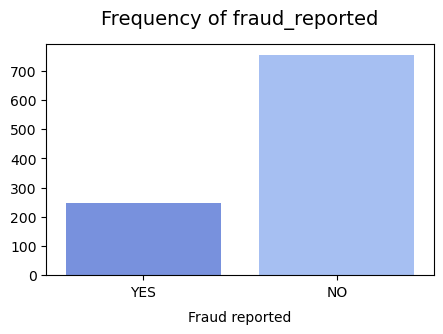

In [33]:
# Set the custom palette
sns.set_palette('coolwarm')

# Visualize the frequency of fraud_reported
col = 'fraud_reported'
plt.figure(figsize=(5, 3))
ax = sns.countplot(x=col, data=df)


plt.xlabel('Fraud reported', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks((0, 1), ['YES', 'NO'], size=10)
plt.title(f"Frequency of {col}", size=14, y=1.05);

In [34]:
# Remove and transform the date columns
date_col = ['policy_bind_date', 'incident_date']

for col in date_col:
    categorical_col.remove(col)
    df[col] = pd.to_datetime(df[col])
    print(f"The {col} was transformed as {df[col].dtype}")

The policy_bind_date was transformed as datetime64[ns]
The incident_date was transformed as datetime64[ns]


In [35]:
# List of categorical columns in the dataset
for i,col in enumerate(categorical_col[:-1]):
    print(f"{i+1}. {col}")

1. policy_state
2. policy_csl
3. insured_sex
4. insured_education_level
5. insured_occupation
6. insured_hobbies
7. insured_relationship
8. incident_type
9. collision_type
10. incident_severity
11. authorities_contacted
12. incident_state
13. incident_city
14. property_damage
15. police_report_available
16. auto_make
17. auto_model


,policy_state
OH,0.351351
IL,0.338338
IN,0.310310


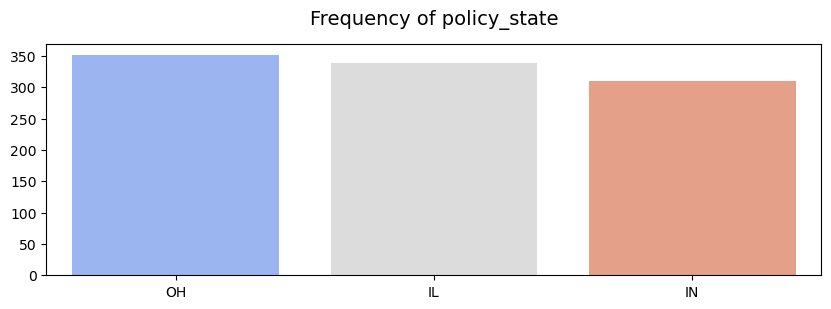

In [36]:
# Visualize the frequency of policy_state(1)
col = 'policy_state'
plt.figure(figsize=(10, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)

df[col].value_counts(normalize=True).to_frame()

,250/500,100/300,500/1000
policy_csl,350,349,300


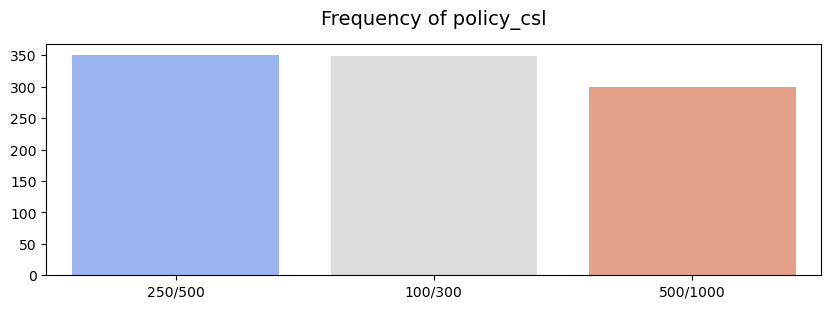

In [37]:
# Visualize the frequency of policy_csl(2)
col = 'policy_csl'
plt.figure(figsize=(10, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)

df[col].value_counts().to_frame().T

,FEMALE,MALE
insured_sex,537,462


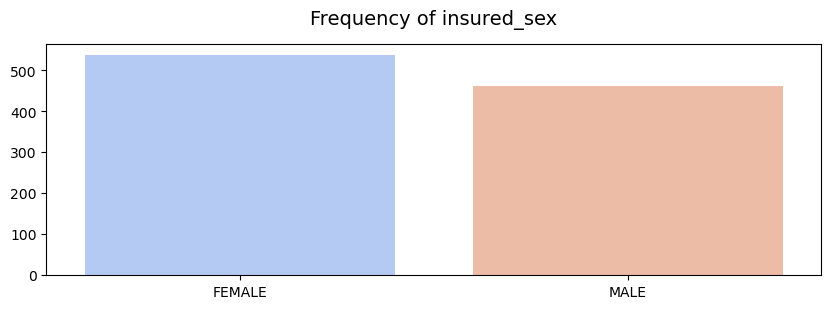

In [38]:
# Visualize the frequency of insured_sex(3)
col = 'insured_sex'
plt.figure(figsize=(10, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)

df[col].value_counts().to_frame().T

,JD,High School,Associate,MD,Masters,PhD,College
insured_education_level,161,160,145,143,143,125,122


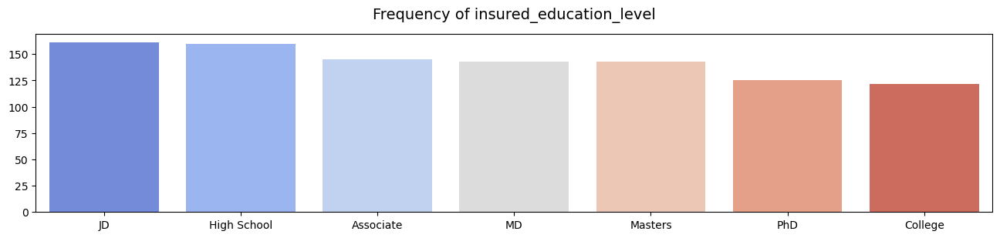

In [39]:
# Visualize the frequency of insured_education_level(4)
col = 'insured_education_level'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')


plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)

df[col].value_counts().to_frame().T

,machine-op-inspct,prof-specialty,tech-support,sales,exec-managerial,craft-repair,transport-moving,other-service,priv-house-serv,armed-forces,adm-clerical,protective-serv,handlers-cleaners,farming-fishing
insured_occupation,93,85,78,76,76,73,72,71,71,69,65,63,54,53


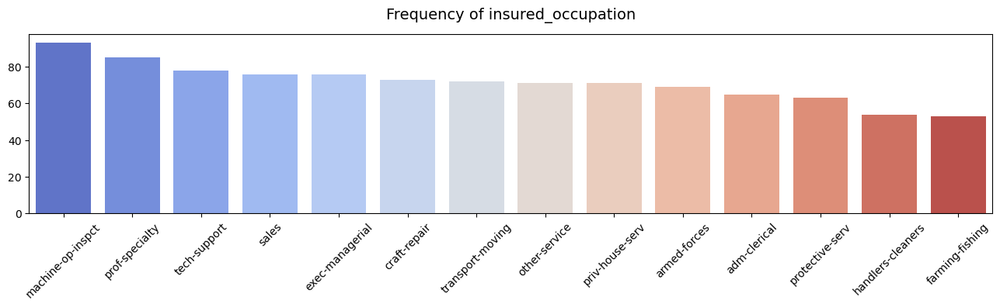

In [40]:
# Visualize the frequency of insured_occupation(5)
col = 'insured_occupation'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=45)
plt.title(f"Frequency of {col}", size=14, y=1.05)

df[col].value_counts().to_frame().T

,reading,paintball,exercise,bungie-jumping,movies,camping,golf,kayaking,yachting,hiking,video-games,skydiving,base-jumping,board-games,polo,chess,dancing,sleeping,cross-fit,basketball
No.,64.00,57.00,57.00,56.00,55.00,55.00,55.00,54.00,53.00,52.00,50.00,49.0,49.0,48.0,47.0,46.0,43.0,40.0,35.0,34.0
%,6.41,5.71,5.71,5.61,5.51,5.51,5.51,5.41,5.31,5.21,5.01,4.9,4.9,4.8,4.7,4.6,4.3,4.0,3.5,3.4


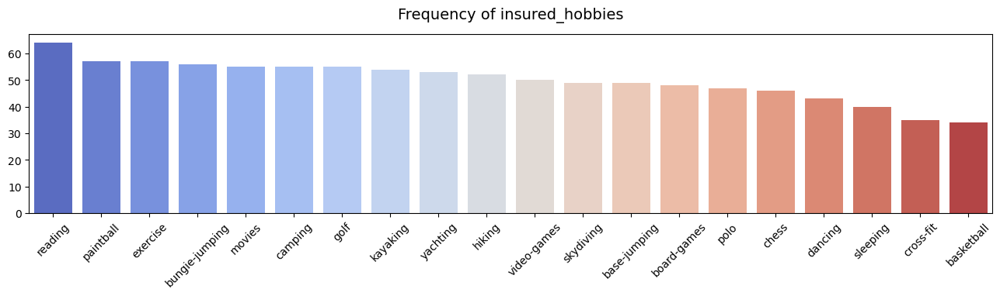

In [41]:
# Visualize the frequency of insured_hobbies(6)
col = 'insured_hobbies'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=45)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts().to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True) * 100, 2)
values_column.T

,own-child,other-relative,not-in-family,husband,wife,unmarried
No.,183.00,177.00,174.00,169.00,155.00,141.00
%,18.32,17.72,17.42,16.92,15.52,14.11


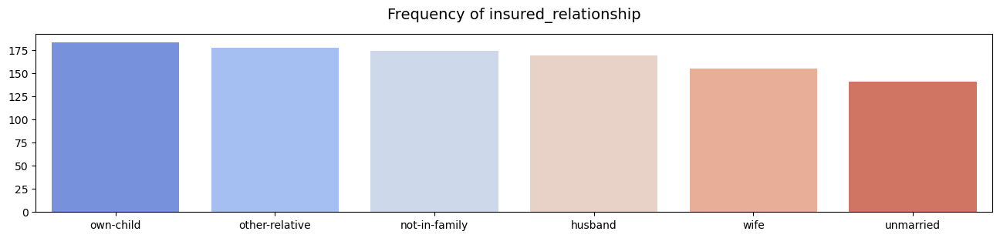

In [42]:
# Visualize the frequency of insured_relationship(7)
col = 'insured_relationship'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=0)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts().to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True) * 100, 2)
values_column.T

,Multi-vehicle Collision,Single Vehicle Collision,Vehicle Theft,Parked Car
No.,419.00,402.00,94.00,84.00
%,41.94,40.24,9.41,8.41


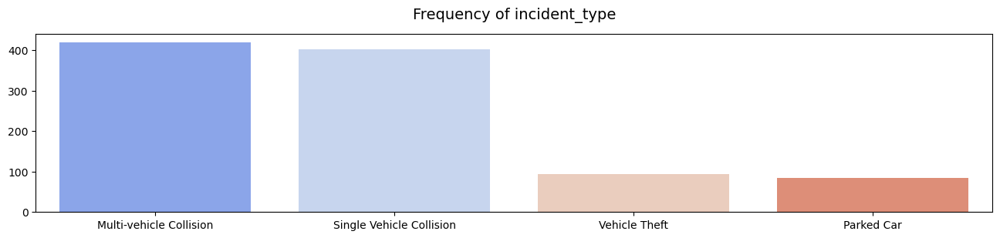

In [43]:
# Visualize the frequency of incident_type(8)
col = 'incident_type'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')
 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=0)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts().to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True) * 100, 2)
values_column.T

,Rear Collision,Side Collision,Front Collision,?
No.,292.00,275.00,254.00,178.00
%,29.23,27.53,25.43,17.82


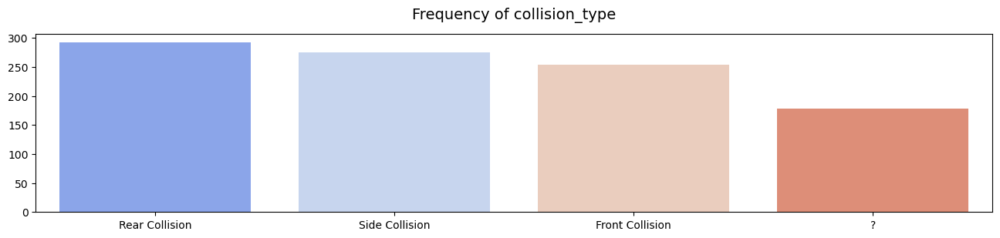

In [44]:
# Visualize the frequency of collision_type(9)
col = 'collision_type'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')


plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=0)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts().to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True) * 100, 2)
values_column.T

,Minor Damage,Total Loss,Major Damage,Trivial Damage
No.,354.00,280.00,275.00,90.00
%,35.44,28.03,27.53,9.01


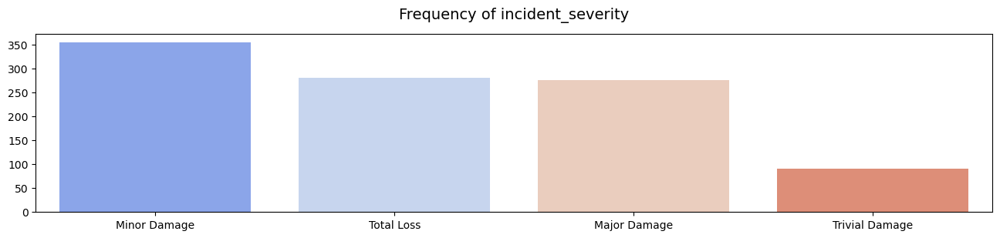

In [45]:
# Visualize the frequency of incident_severity(10)
col = 'incident_severity'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')


plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=0)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts().to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True) * 100, 2)
values_column.T

,Police,Fire,Other,Ambulance,None
No.,291.00,223.00,198.00,196.00,91.00
%,29.13,22.32,19.82,19.62,9.11


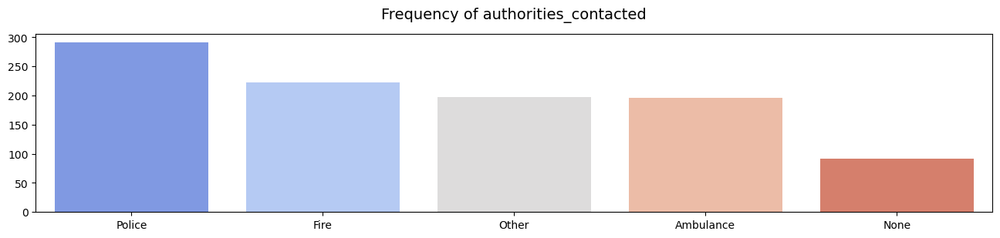

In [46]:
# Visualize the frequency of authorities_contacted(11)
col = 'authorities_contacted'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')
 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=0)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts().to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True) * 100, 2)
values_column.T

,NY,SC,WV,VA,NC,PA,OH
No.,262.00,247.00,217.00,110.00,110.00,30.0,23.0
%,26.23,24.72,21.72,11.01,11.01,3.0,2.3


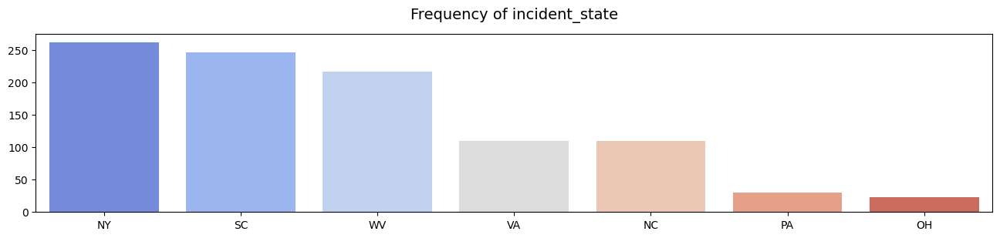

In [47]:
# Visualize the frequency of incident_state(12)
col = 'incident_state'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=0)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts().to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True) * 100, 2)
values_column.T

,Springfield,Arlington,Columbus,Northbend,Hillsdale,Riverwood,Northbrook
No.,157.00,152.00,148.00,145.00,141.00,134.00,122.00
%,15.72,15.22,14.81,14.51,14.11,13.41,12.21


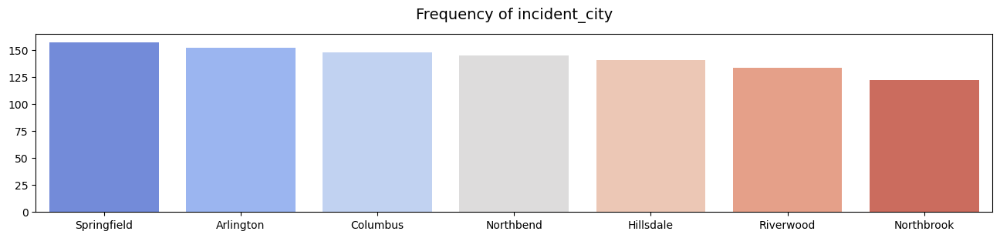

In [48]:
# Visualize the frequency of incident_city(13)
col = 'incident_city'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=0)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts().to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True) * 100, 2)
values_column.T

,?,NO,YES
No.,360.00,338.00,301.00
%,36.04,33.83,30.13


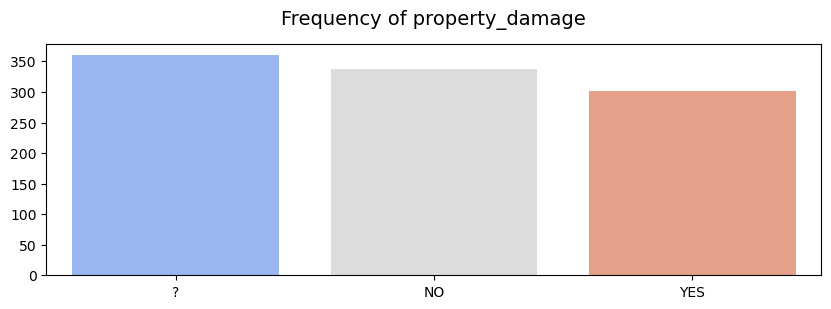

In [49]:
# Visualize the frequency of property_damage(14)
col = 'property_damage'
plt.figure(figsize=(10, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')
 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=0)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts().to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True) * 100, 2)
values_column.T

,?,NO,YES
No.,343.00,343.00,313.00
%,34.33,34.33,31.33


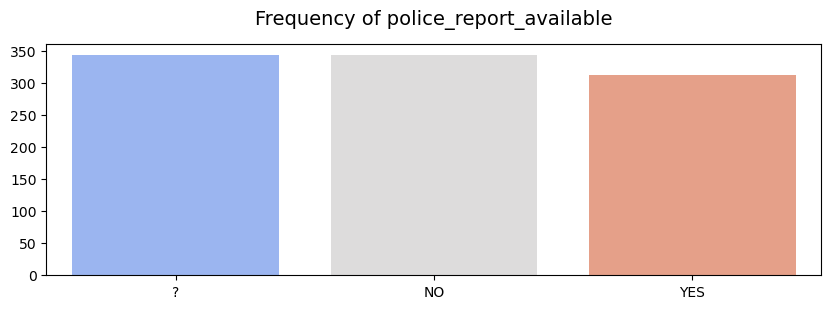

In [50]:
# Visualize the frequency of police_report_available(15)
col = 'police_report_available'
plt.figure(figsize=(10, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=0)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts().to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True) * 100, 2)
values_column.T

,Dodge,Suburu,Saab,Nissan,Chevrolet,Ford,BMW,Toyota,Audi,Accura,Volkswagen,Jeep,Mercedes,Honda
No.,80.00,80.00,79.00,78.00,76.00,72.00,72.00,70.00,69.00,68.00,68.00,67.00,65.00,55.00
%,8.01,8.01,7.91,7.81,7.61,7.21,7.21,7.01,6.91,6.81,6.81,6.71,6.51,5.51


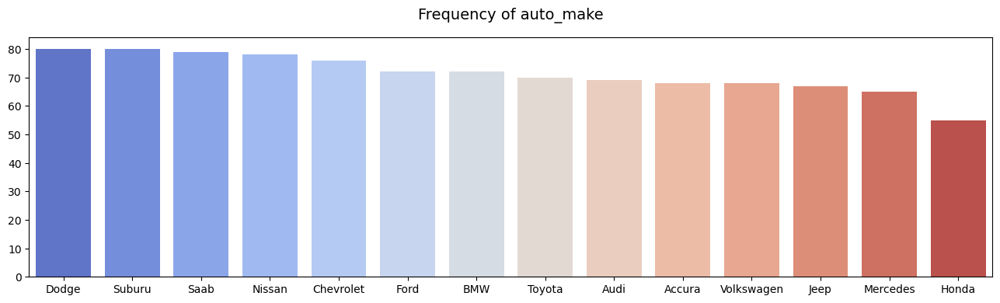

In [51]:
# Visualize the frequency of auto_make(16)
col = 'auto_make'
plt.figure(figsize=(16, 4))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')


plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=0)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts().to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True) * 100, 2)
values_column.T

,RAM,Wrangler,A3,Neon,MDX,Jetta,Passat,A5,Legacy,Pathfinder,...,Impreza,Corolla,TL,CRV,C300,3 Series,X6,M5,Accord,RSX
No.,43.0,42.0,37.0,37.0,36.0,35.0,33.0,32.0,32.0,31.0,...,20.0,20.0,20.0,20.0,18.0,18.0,16.0,15.0,13.0,12.0
%,4.3,4.2,3.7,3.7,3.6,3.5,3.3,3.2,3.2,3.1,...,2.0,2.0,2.0,2.0,1.8,1.8,1.6,1.5,1.3,1.2


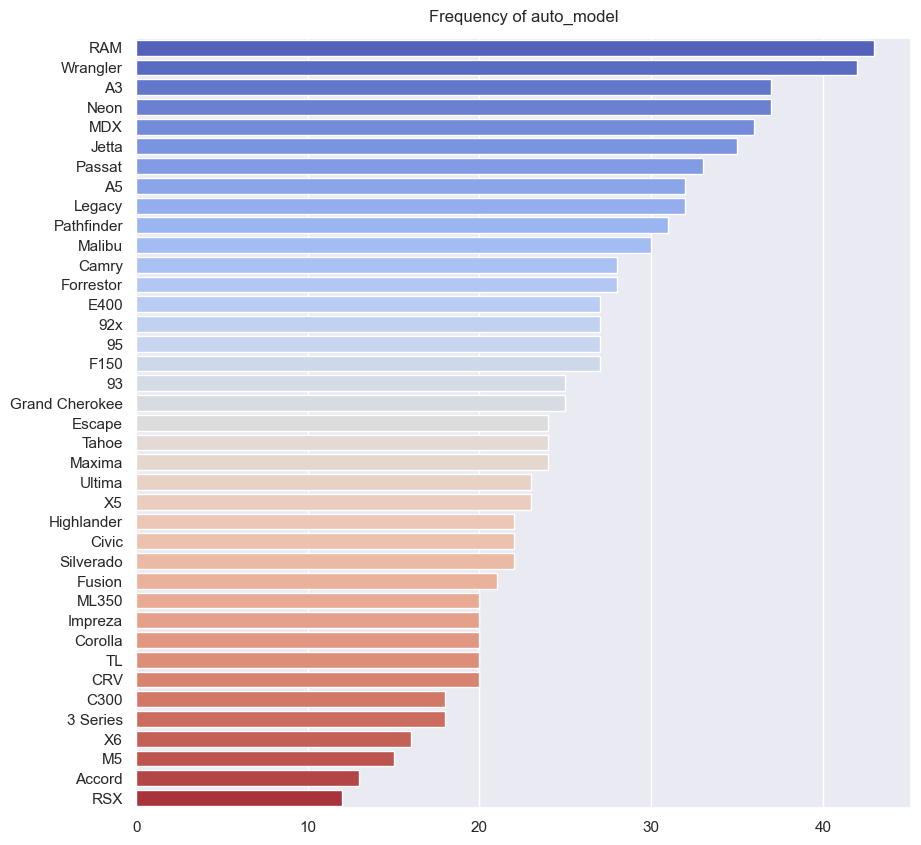

In [52]:
# Visualize the frequency of auto_model(17)
col = 'auto_model'
plt.figure(figsize=(10, 10))
sns.set(font_scale=1)
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(y=df_sorted.index, x=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.xticks(rotation=0)
plt.title(f"Frequency of {col}", size=12, y=1.01)

values_column = df[col].value_counts().to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True) * 100, 2)
values_column.T

In [53]:
# List of numerical columns that look like categories
for i,col in enumerate(num_cat_col):
    print(f"{i+1}. {col}")

1. policy_deductable
2. bodily_injuries
3. witnesses
4. number_of_vehicles_involved
5. umbrella_limit
6. auto_year
7. incident_hour_of_the_day
8. age


,1000,500,2000
No.,350.00,342.00,307.00
%,35.04,34.23,30.73


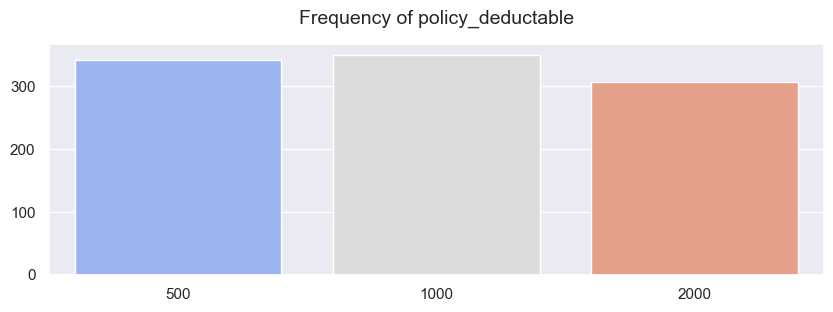

In [54]:
# Visualize the frequency of policy_deductable(1)
col = 'policy_deductable'
plt.figure(figsize=(10, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts( dropna=False).to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True, dropna=False) * 100, 2)
values_column.T

,0,2,1
No.,340.00,332.00,327.00
%,34.03,33.23,32.73


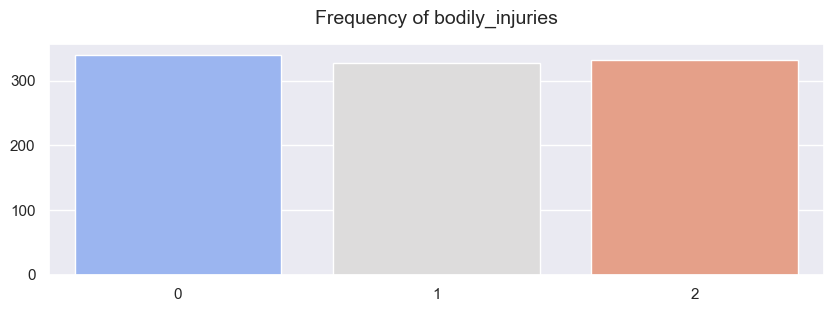

In [55]:
# Visualize the frequency of bodily_injuries(2)
col = 'bodily_injuries'
plt.figure(figsize=(10, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')
 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts( dropna=False).to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True, dropna=False) * 100, 2)
values_column.T

,1,0,2,3
No.,258.00,249.00,249.00,243.00
%,25.83,24.92,24.92,24.32


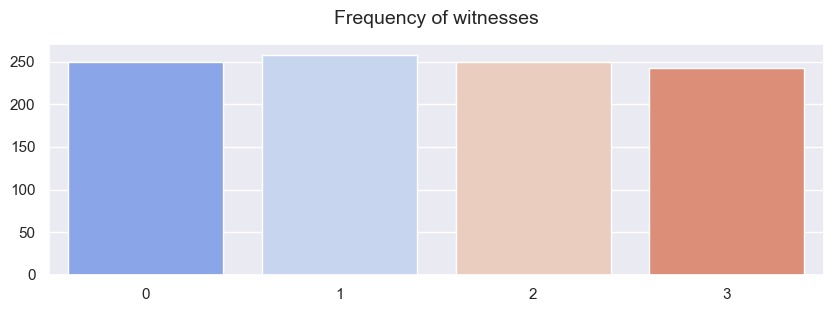

In [56]:
# Visualize the frequency of witnesses(3)
col = 'witnesses'
plt.figure(figsize=(10, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts( dropna=False).to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True, dropna=False) * 100, 2)
values_column.T

,1,3,4,2
No.,580.00,358.00,31.0,30.0
%,58.06,35.84,3.1,3.0


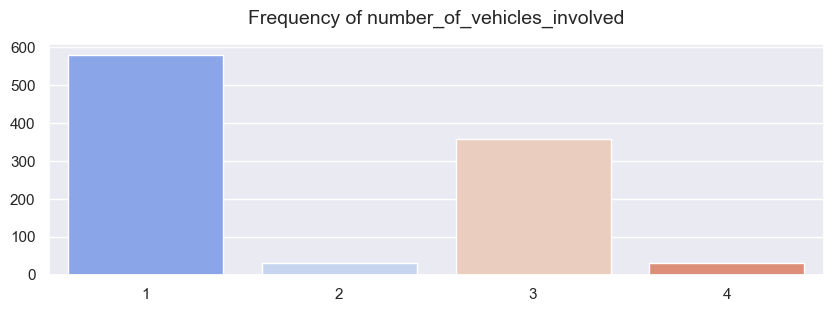

In [57]:
# Visualize the frequency of number_of_vehicles_involved(4)
col = 'number_of_vehicles_involved'
plt.figure(figsize=(10, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts( dropna=False).to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True, dropna=False) * 100, 2)
values_column.T

,0,6000000,5000000,4000000,7000000,3000000,8000000,9000000,2000000,10000000,-1000000
No.,797.00,57.00,46.0,39.0,29.0,12.0,8.0,5.0,3.0,2.0,1.0
%,79.78,5.71,4.6,3.9,2.9,1.2,0.8,0.5,0.3,0.2,0.1


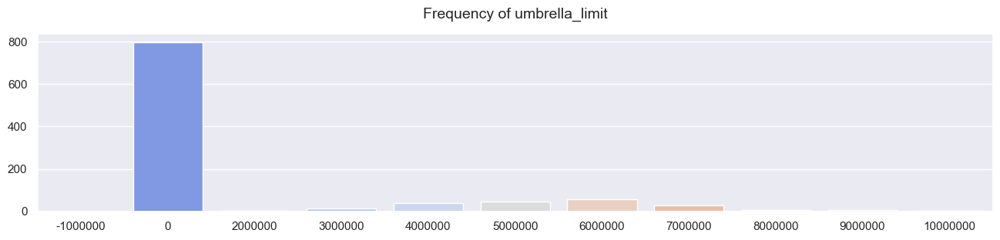

In [58]:
# Visualize the frequency of umbrella_limit(5)
col = 'umbrella_limit'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')


plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts( dropna=False).to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True, dropna=False) * 100, 2)
values_column.T

,1995,1999,2005,2006,2011,2007,2003,2010,2009,2002,...,2015,2012,1997,2008,2014,2000,2001,1998,2004,1996
No.,56.00,55.00,54.00,53.00,53.00,52.00,51.00,50.00,50.00,49.0,...,47.0,46.0,46.0,45.0,44.0,42.0,42.0,40.0,38.0,37.0
%,5.61,5.51,5.41,5.31,5.31,5.21,5.11,5.01,5.01,4.9,...,4.7,4.6,4.6,4.5,4.4,4.2,4.2,4.0,3.8,3.7


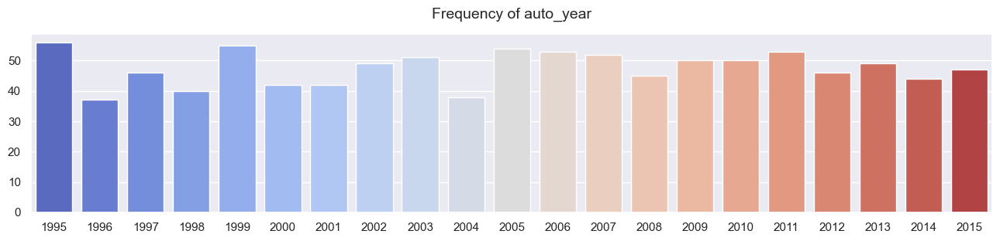

In [59]:
# Visualize the frequency of auto_year(6)
col = 'auto_year'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')
 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts( dropna=False).to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True, dropna=False) * 100, 2)
values_column.T

,17,3,0,23,16,10,13,4,6,14,...,12,7,15,22,8,20,5,2,11,1
No.,54.00,53.00,52.00,51.00,49.0,46.0,46.0,46.0,44.0,43.0,...,40.0,40.0,39.0,38.0,36.0,34.0,32.0,31.0,30.0,29.0
%,5.41,5.31,5.21,5.11,4.9,4.6,4.6,4.6,4.4,4.3,...,4.0,4.0,3.9,3.8,3.6,3.4,3.2,3.1,3.0,2.9


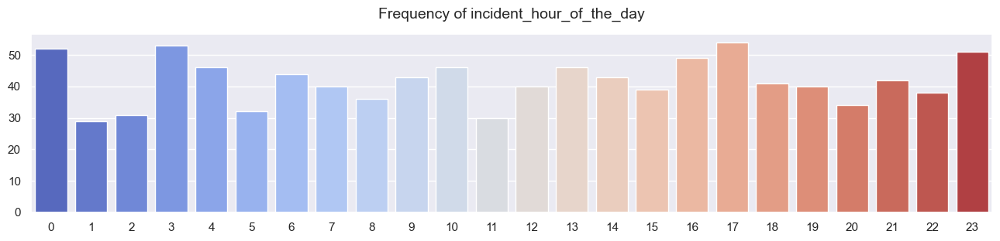

In [60]:
# Visualize the frequency of incident_hour_of_the_day(7)
col = 'incident_hour_of_the_day'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')
 

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts( dropna=False).to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True, dropna=False) * 100, 2)
values_column.T

,43,39,41,34,30,38,31,37,33,32,...,23,21,59,62,52,64,63,19,20,22
No.,49.0,48.0,45.0,44.0,42.0,42.0,42.0,41.0,39.0,38.0,...,7.0,6.0,5.0,4.0,4.0,2.0,2.0,1.0,1.0,1.0
%,4.9,4.8,4.5,4.4,4.2,4.2,4.2,4.1,3.9,3.8,...,0.7,0.6,0.5,0.4,0.4,0.2,0.2,0.1,0.1,0.1


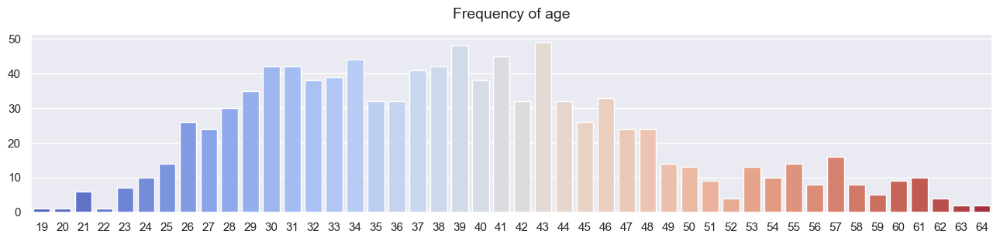

In [61]:
# Visualize the frequency of age(8)
col = 'age'
plt.figure(figsize=(16, 3))
df_sorted = df[col].value_counts().to_frame()
ax = sns.barplot(x=df_sorted.index, y=df_sorted[col], palette='coolwarm')

plt.xlabel('', size=10, labelpad=8)
plt.ylabel('', size=10, labelpad=8)
plt.title(f"Frequency of {col}", size=14, y=1.05)

values_column = df[col].value_counts( dropna=False).to_frame('No.')
values_column['%'] = round(df[col].value_counts(normalize=True, dropna=False) * 100, 2)
values_column.T

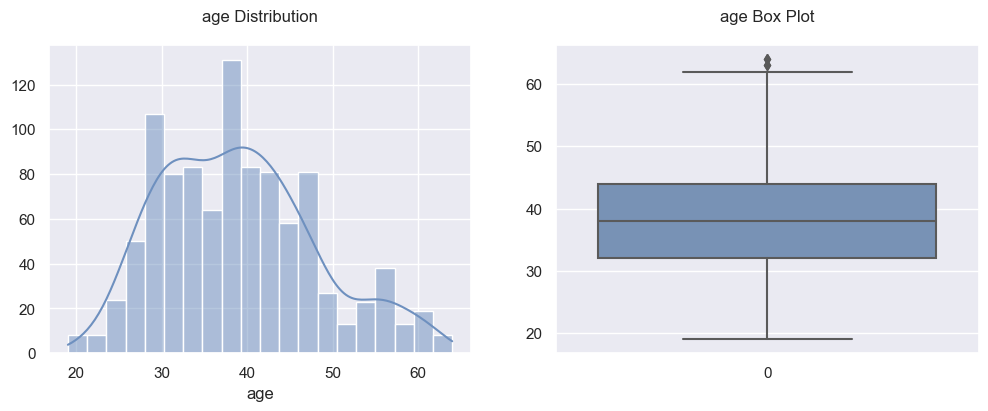

Skewness of age : 0.4814605728959513


In [62]:
col = 'age'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='#6e90bf')
sns.boxplot(df[col], ax=axes[1], color='#6e90bf')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of Age
print(f"Skewness of {col} : {df[col].skew()}")

In [63]:
# List of numerical columns
for i,col in enumerate(numerical_col):
    print(f"{i+1}. {col}")

1. months_as_customer
2. policy_annual_premium
3. capital-gains
4. capital-loss
5. total_claim_amount
6. injury_claim
7. property_claim
8. vehicle_claim


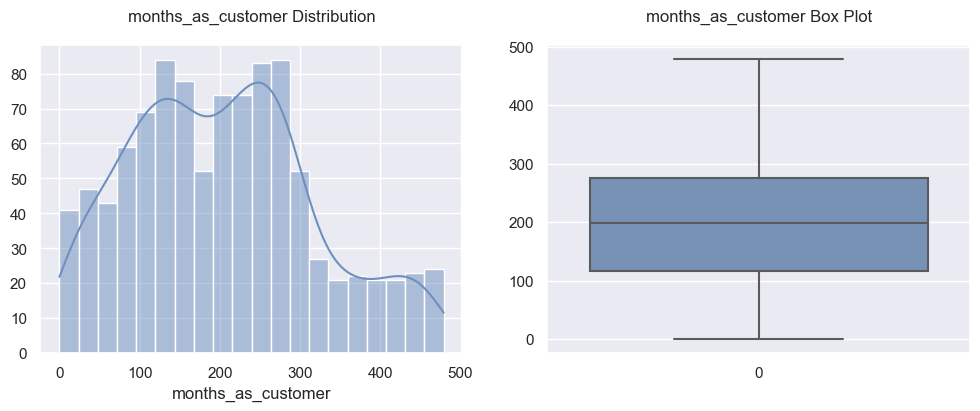

Skewness of months_as_customer : 0.3646151096541134


In [64]:
#Visualize (1) months_as_customer distribution
col = 'months_as_customer'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='#6e90bf')
sns.boxplot(df[col], ax=axes[1], color='#6e90bf')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of months_as_customer
print(f"Skewness of {col} : {df[col].skew()}")

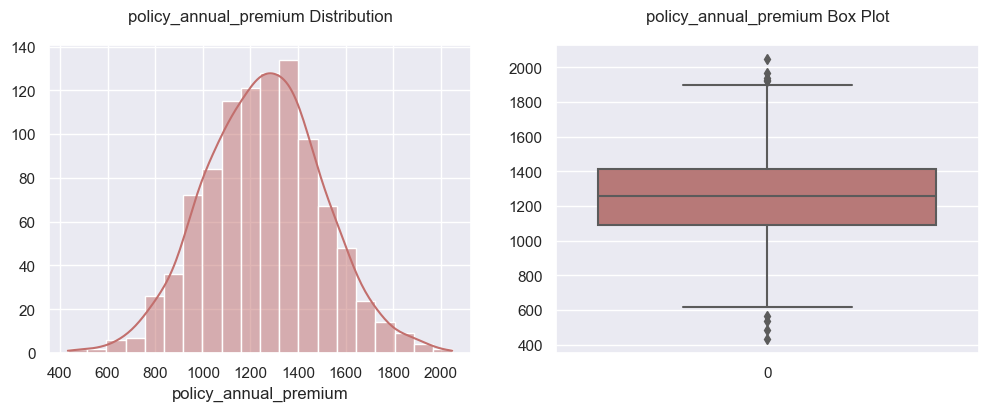

Skewness of policy_annual_premium : 0.006021573389890914


In [65]:
#Visualize (2) policy_annual_premium distribution
col = 'policy_annual_premium'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='#c26f6d')
sns.boxplot(df[col], ax=axes[1], color='#c26f6d')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of policy_annual_premium
print(f"Skewness of {col} : {df[col].skew()}")


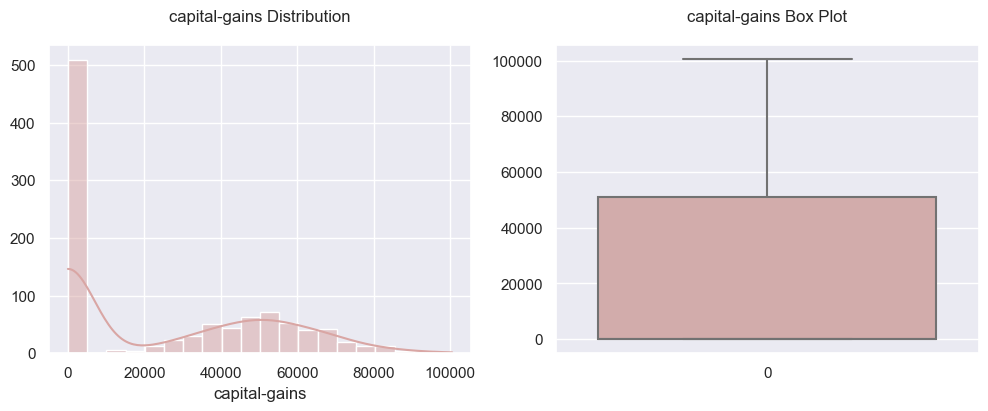

Skewness of capital-gains : 0.4813520464014395


In [66]:
#Visualize (3) capital-gains distribution
col = 'capital-gains'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='#d9a6a4')
sns.boxplot(df[col], ax=axes[1], color='#d9a6a4')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of capital-gains
print(f"Skewness of {col} : {df[col].skew()}")

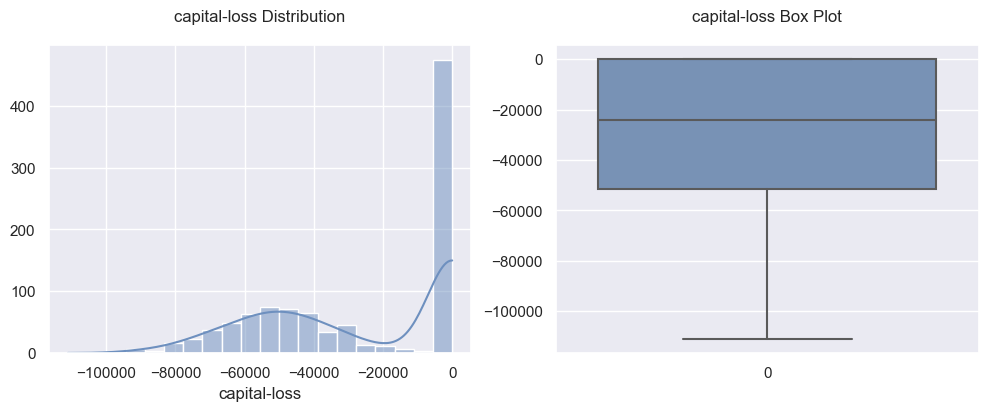

Skewness of capital-loss : -0.38981318779420304


In [67]:
#Visualize (4) capital-loss distribution
col = 'capital-loss'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='#6e90bf')
sns.boxplot(df[col], ax=axes[1], color='#6e90bf')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of capital-loss
print(f"Skewness of {col} : {df[col].skew()}")

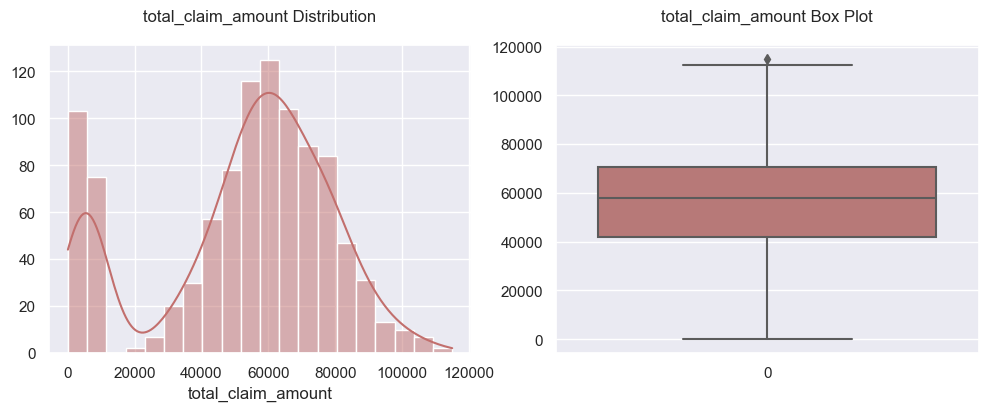

Skewness of total_claim_amount : -0.5929584528777062


In [68]:
#Visualize (5) total_claim_amount distribution
col = 'total_claim_amount'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='#c26f6d')
sns.boxplot(df[col], ax=axes[1], color='#c26f6d')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of total_claim_amount
print(f"Skewness of {col} : {df[col].skew()}")

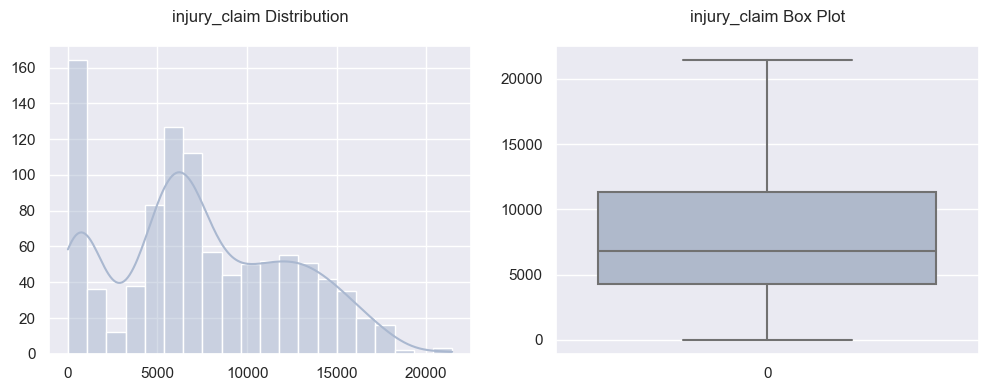

Skewness of injury_claim : 0.26413086782332285


In [69]:
#Visualize (6) injury_claim distribution
col = 'injury_claim'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='#aab8d0')
sns.boxplot(df[col], ax=axes[1], color='#aab8d0')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)
axes[0].set_xlabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)
axes[1].set_xlabel('', size=10, labelpad=8)

plt.show()

# Show the skewness of injury_claim
print(f"Skewness of {col} : {df[col].skew()}")

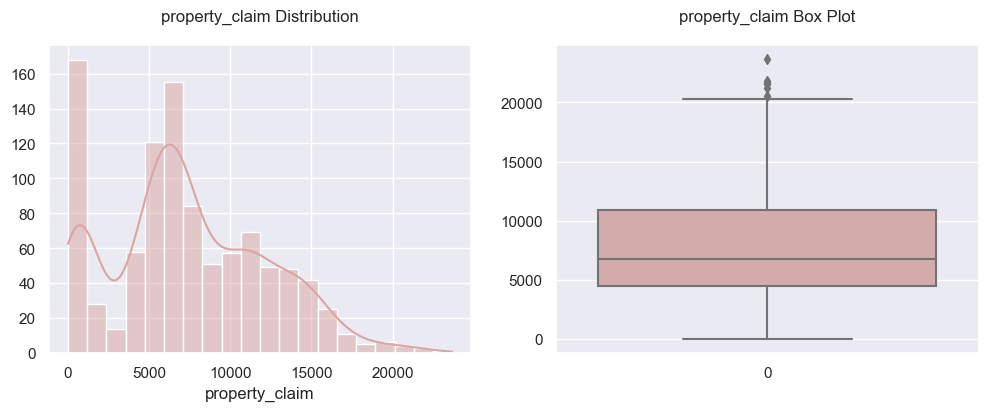

Skewness of property_claim : 0.38067033294250646


In [70]:
#Visualize (7) property_claim distribution
col = 'property_claim'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='#d9a6a4')
sns.boxplot(df[col], ax=axes[1], color='#d9a6a4')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of property_claim
print(f"Skewness of {col} : {df[col].skew()}")

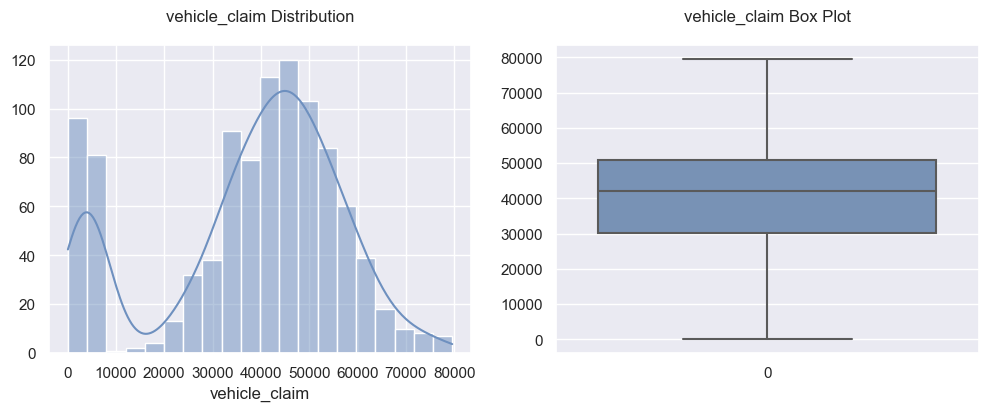

Skewness of vehicle_claim : -0.6194804015019331


In [71]:
#Visualize (8) vehicle_claim distribution
col = 'vehicle_claim'
fig, axes = plt.subplots(1, 2, figsize=(12, 4))

sns.histplot(df[col], kde=True , bins=20, ax=axes[0], color='#6e90bf')
sns.boxplot(df[col], ax=axes[1], color='#6e90bf')

axes[0].set_title(f'{col} Distribution', size=12, y=1.05)
axes[0].set_ylabel('', size=10, labelpad=8)

axes[1].set_title(f'{col} Box Plot', size=12, y=1.05)

plt.show()

# Show the skewness of vehicle_claim
print(f"Skewness of {col} : {df[col].skew()}")

In [72]:
numerical_col

['months_as_customer',
 'policy_annual_premium',
 'capital-gains',
 'capital-loss',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim']

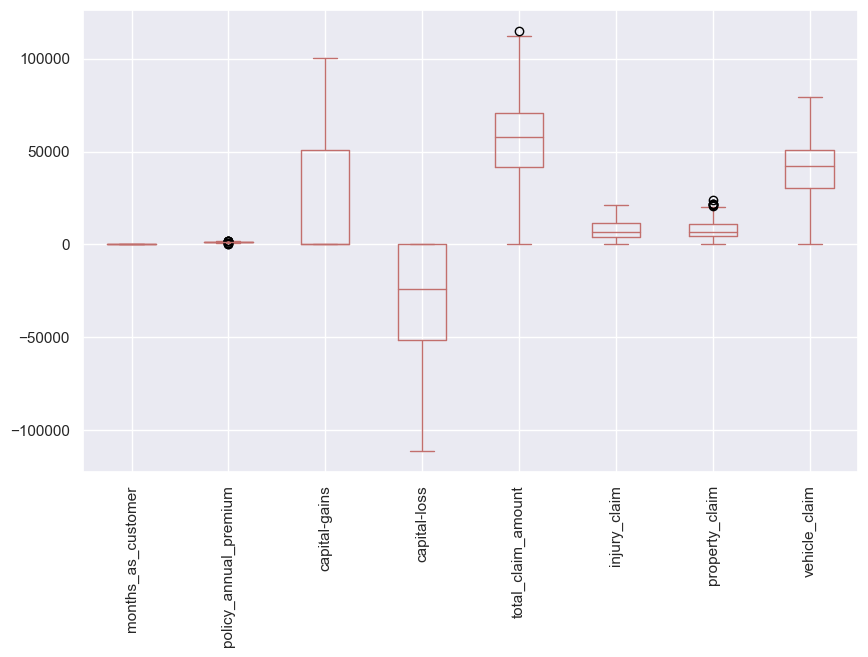

In [73]:
# Draw a boxplot for numerical_col variables 
plt.figure(figsize=(10, 6))
df.boxplot(column=numerical_col, figsize=(10,10), color='#c26f6d')
plt.xticks(rotation=90);

In [74]:
# List of numerical columns
for i,col in enumerate(numerical_col):
    print(f"{i+1}. {col}")

1. months_as_customer
2. policy_annual_premium
3. capital-gains
4. capital-loss
5. total_claim_amount
6. injury_claim
7. property_claim
8. vehicle_claim


In [75]:
def boxplot_by_fraud_reported(col, xlabel, figsize, palette):
    plt.figure(figsize=figsize)
    sns.set_palette(palette)
    sns.boxplot(data=df[[col,'fraud_reported']], x=col, y='fraud_reported')
    plt.ylabel('Fraud Reported')
    plt.xlabel(xlabel)
    plt.title(f"BoxPlot of {col} vs. Fraud reported")
    plt.show()

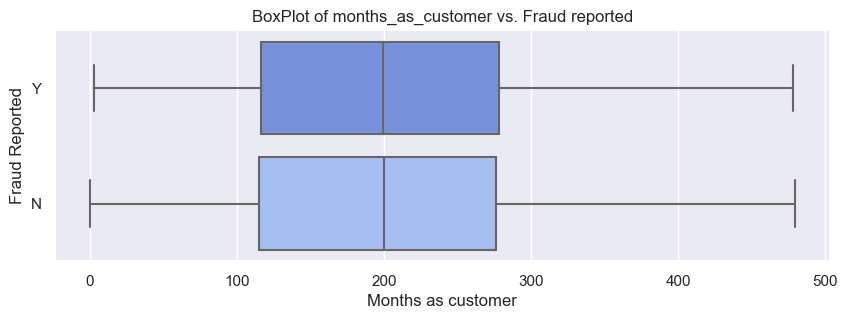

In [76]:
# Visualizing and comparing each independent variable with target
# Columns 1. months_as_customer 
col = 'months_as_customer'
boxplot_by_fraud_reported(col, 'Months as customer', figsize=(10,3), palette='coolwarm')

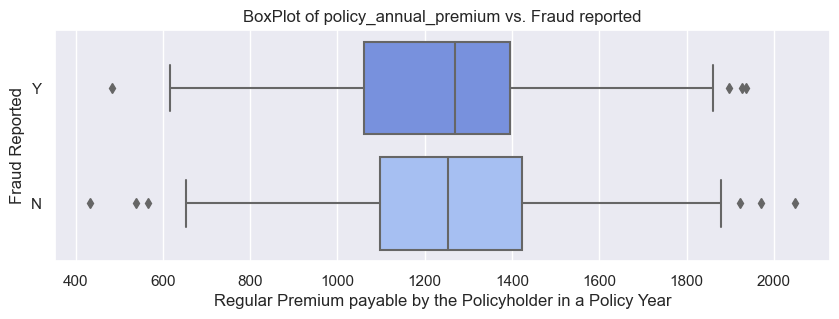

In [77]:
# Visualizing and comparing each independent variable with target
# Columns 2. policy_annual_premium 
col = 'policy_annual_premium'
boxplot_by_fraud_reported(col, 
                          'Regular Premium payable by the Policyholder in a Policy Year', 
                          figsize=(10, 3), palette='coolwarm')

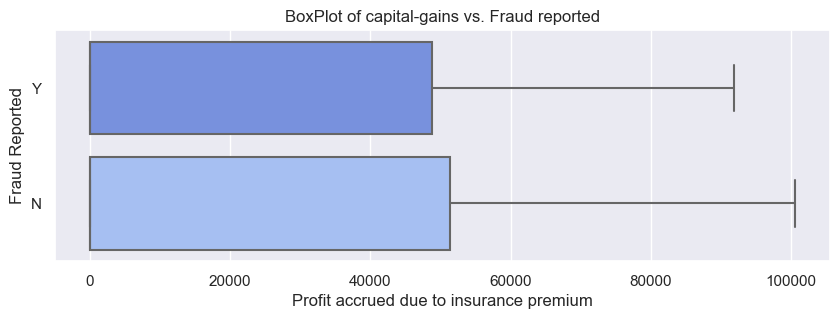

In [78]:
# Visualizing and comparing each independent variable with target
# Columns 3. capital-gains 
col = 'capital-gains'
boxplot_by_fraud_reported(col, 
                          'Profit accrued due to insurance premium', 
                          figsize=(10, 3), palette='coolwarm')

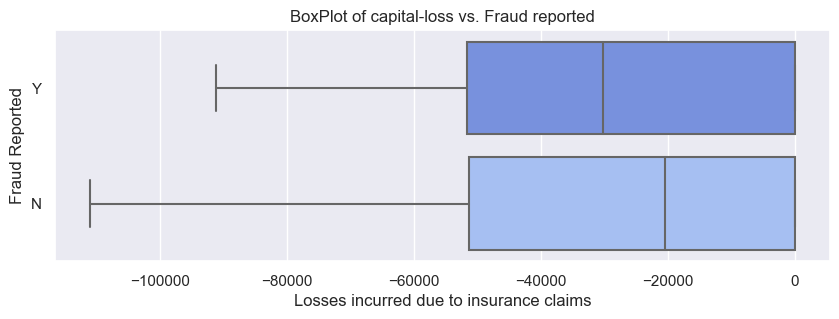

In [79]:
# Visualizing and comparing each independent variable with target
# Columns 4. capital-loss 
col = 'capital-loss'
boxplot_by_fraud_reported(col, 
                          'Losses incurred due to insurance claims', 
                          figsize=(10, 3), palette='coolwarm')

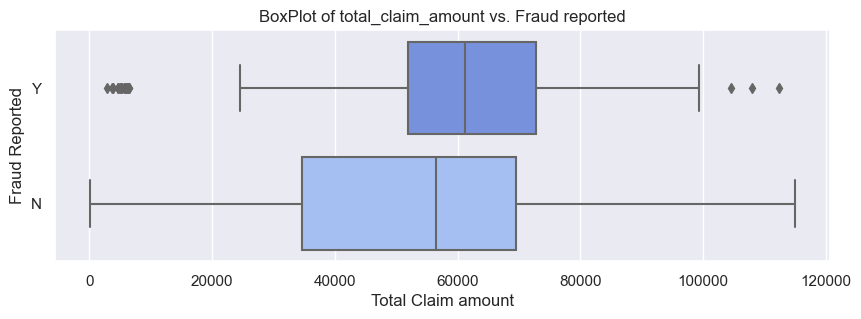

In [80]:
# Visualizing and comparing each independent variable with target
# Columns 5. total_claim_amount 
col = 'total_claim_amount'
boxplot_by_fraud_reported(col, 
                          'Total Claim amount', 
                          figsize=(10, 3), palette='coolwarm')

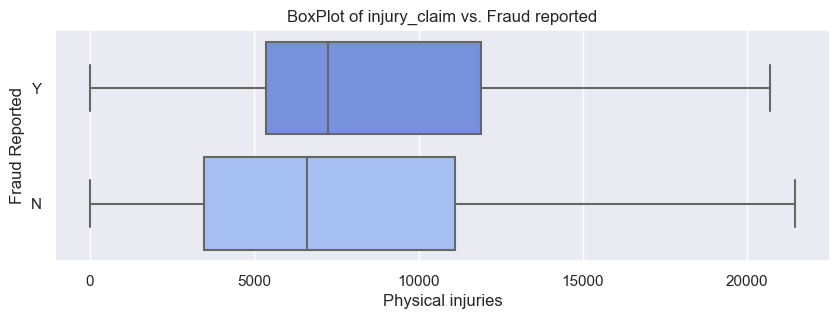

In [81]:
# Visualizing and comparing each independent variable with target
# Columns 6. injury_claim 
col = 'injury_claim'
boxplot_by_fraud_reported(col, 
                          'Physical injuries', 
                          figsize=(10, 3), palette='coolwarm')

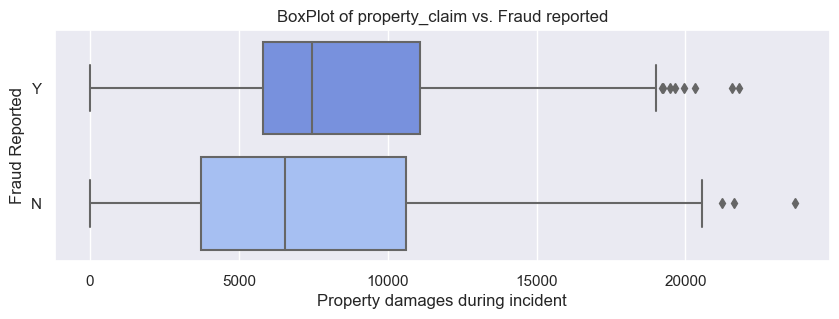

In [82]:
# Visualizing and comparing each independent variable with target
# Columns 7. property_claim
col = 'property_claim'
boxplot_by_fraud_reported(col, 
                          'Property damages during incident', 
                          figsize=(10, 3), palette='coolwarm')

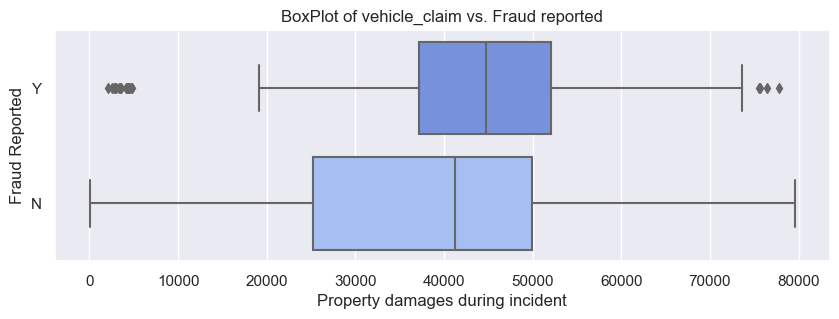

In [83]:
# Visualizing and comparing each independent variable with target
# Columns 8. vehicle_claim
col = 'vehicle_claim'
boxplot_by_fraud_reported(col, 
                          'Property damages during incident', 
                          figsize=(10, 3), palette='coolwarm')

In [84]:
# List of categorical columns in the dataset
for i,col in enumerate(categorical_col[:-1] + num_cat_col):
    print(f"{i+1}. {col}")


1. policy_state
2. policy_csl
3. insured_sex
4. insured_education_level
5. insured_occupation
6. insured_hobbies
7. insured_relationship
8. incident_type
9. collision_type
10. incident_severity
11. authorities_contacted
12. incident_state
13. incident_city
14. property_damage
15. police_report_available
16. auto_make
17. auto_model
18. policy_deductable
19. bodily_injuries
20. witnesses
21. number_of_vehicles_involved
22. umbrella_limit
23. auto_year
24. incident_hour_of_the_day
25. age


In [85]:
def plot_counts_by_fraud_reported(col, xlabel, figsize, show_perc, rot=0):
    plt.figure(figsize=figsize)
    ax = sns.countplot(hue='fraud_reported', x=col, data=df)
    
        

    if xlabel != '':
        title = xlabel
    else:
        title = col
    
    plt.xlabel(xlabel, size=10, labelpad=8)
    plt.ylabel('', size=10, labelpad=8)
    plt.xticks(rotation=rot)
    plt.legend(prop={'size':8}, loc='upper right', bbox_to_anchor=(1.20, 1)).set_title("Fraud Reported")
    plt.title(f"Fraud Reported according to {title}", size=14, y=1.05)
    plt.show()

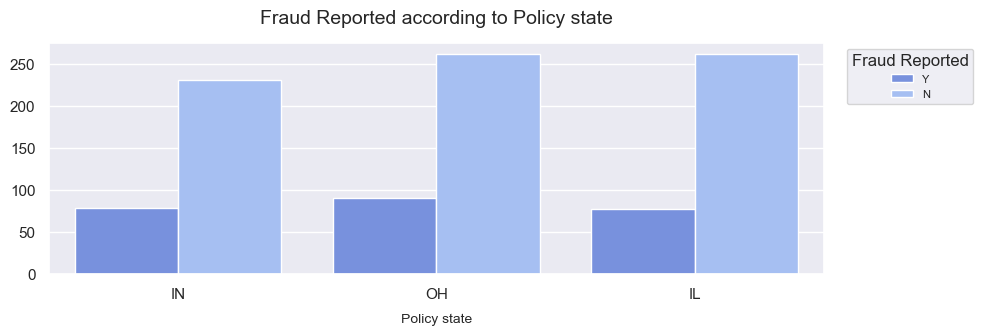

In [86]:
# Compare (1) <policy_state> vs Fraud Reported
col = 'policy_state'
plot_counts_by_fraud_reported(col, xlabel='Policy state', figsize=(10,3), show_perc=True )

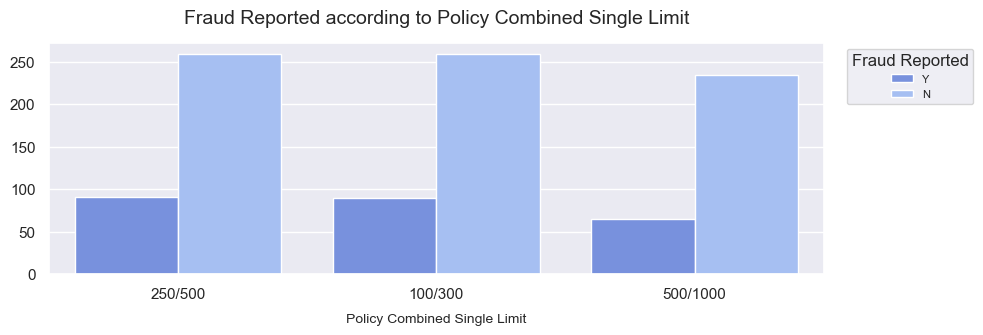

In [87]:
# Compare (2) <policy_csl> vs Fraud Reported
col = 'policy_csl'
plot_counts_by_fraud_reported(col, xlabel='Policy Combined Single Limit', figsize=(10,3), show_perc=True )

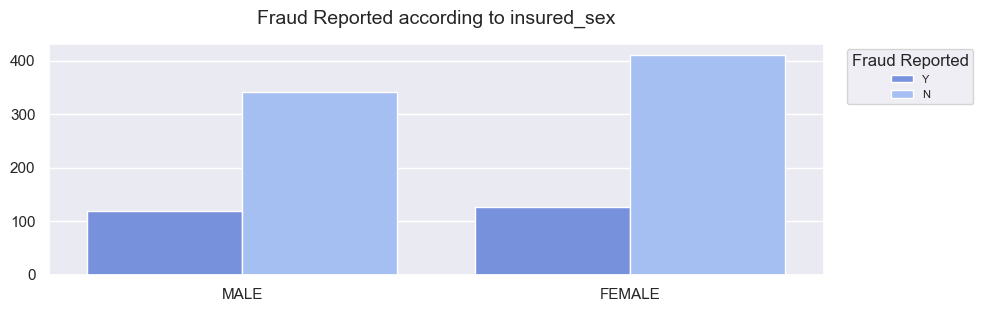

In [88]:
# Compare (3) <insured_sex> vs Fraud Reported
col = 'insured_sex'
plot_counts_by_fraud_reported(col, xlabel='', figsize=(10,3), show_perc=True )

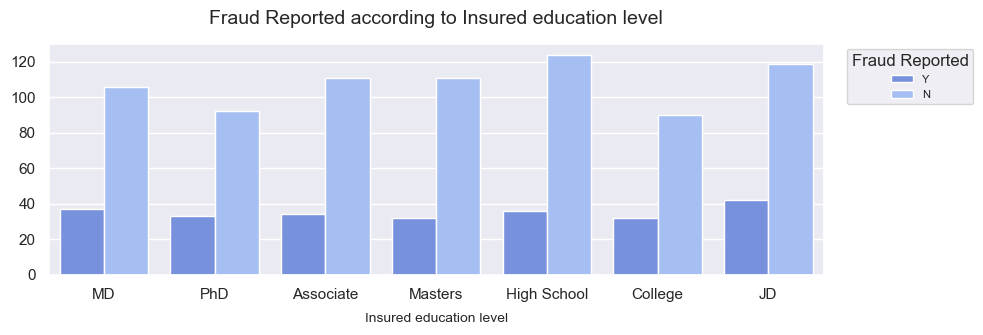

In [89]:
# Compare (4) <insured_education_level> vs Fraud Reported
col = 'insured_education_level'
plot_counts_by_fraud_reported(col, xlabel='Insured education level', figsize=(10,3), show_perc=True )

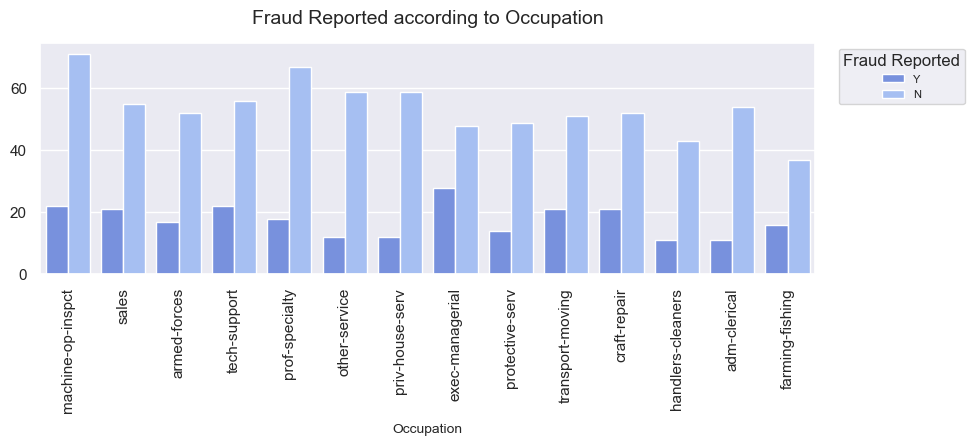

In [90]:
# Compare (5) <insured_occupation> vs Fraud Reported
col = 'insured_occupation'
plot_counts_by_fraud_reported(col, xlabel='Occupation', figsize=(10,3), show_perc=True, rot=90 )

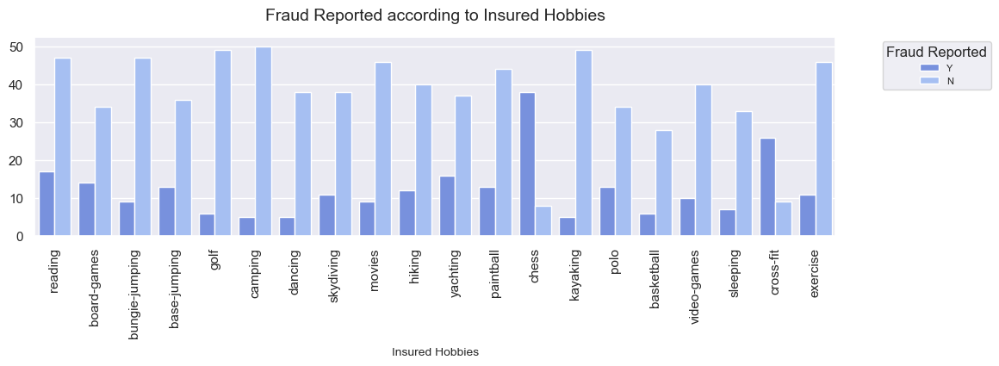

In [91]:
# Compare (6) <insured_hobbies> vs Fraud Reported
col = 'insured_hobbies'
plot_counts_by_fraud_reported(col, xlabel='Insured Hobbies', figsize=(12,3), show_perc=True, rot=90 )

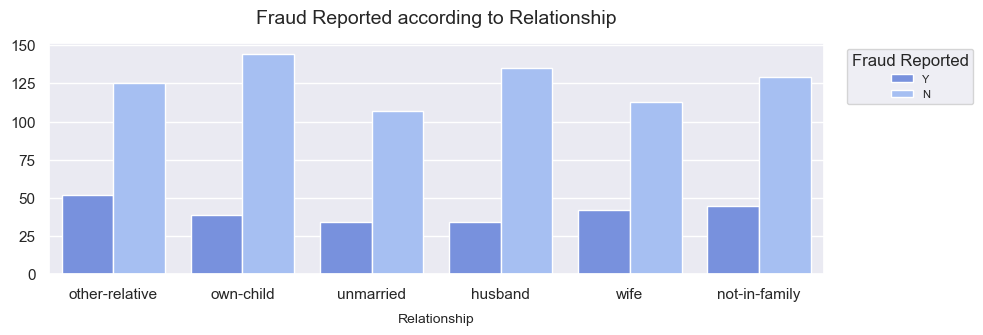

In [92]:
# Compare (7) <insured_relationship> vs Fraud Reported
col = 'insured_relationship'
plot_counts_by_fraud_reported(col, xlabel='Relationship', figsize=(10,3), show_perc=True )

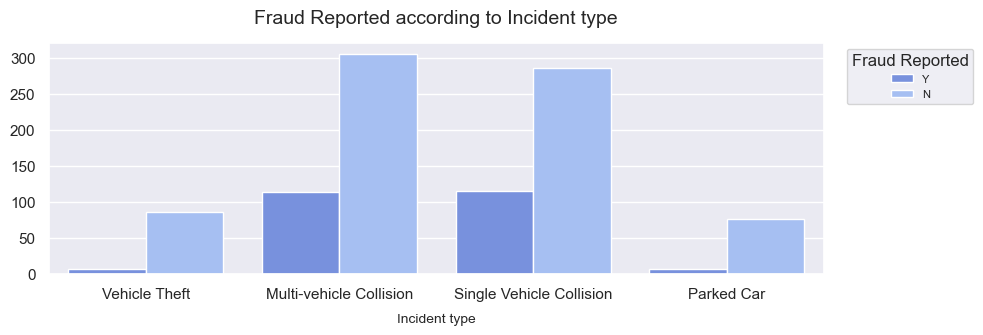

In [93]:
# Compare (8) <incident_type> vs Fraud Reported
col = 'incident_type'
plot_counts_by_fraud_reported(col, xlabel='Incident type', figsize=(10,3), show_perc=True )

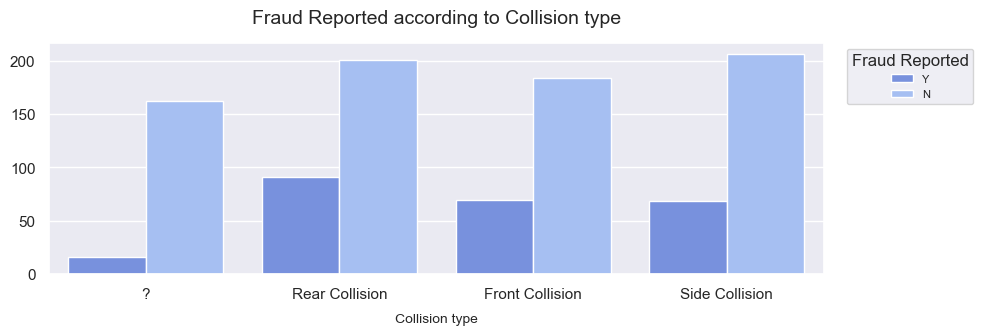

In [94]:
# Compare (9) <collision_type> vs Fraud Reported
col = 'collision_type'
plot_counts_by_fraud_reported(col, xlabel='Collision type', figsize=(10,3), show_perc=True )

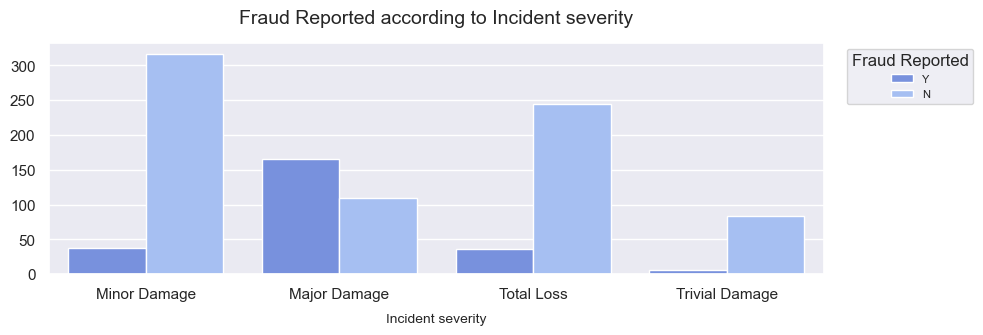

In [95]:
# Compare (10) <incident_severity> vs Fraud Reported
col = 'incident_severity'
plot_counts_by_fraud_reported(col, xlabel='Incident severity', figsize=(10,3), show_perc=True )

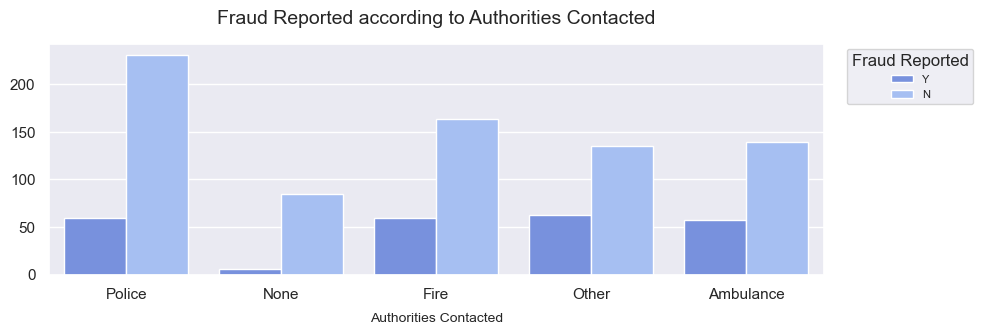

In [96]:
# Compare (11) <authorities_contacted> vs Fraud Reported
col = 'authorities_contacted'
plot_counts_by_fraud_reported(col, xlabel='Authorities Contacted', figsize=(10,3), show_perc=True )

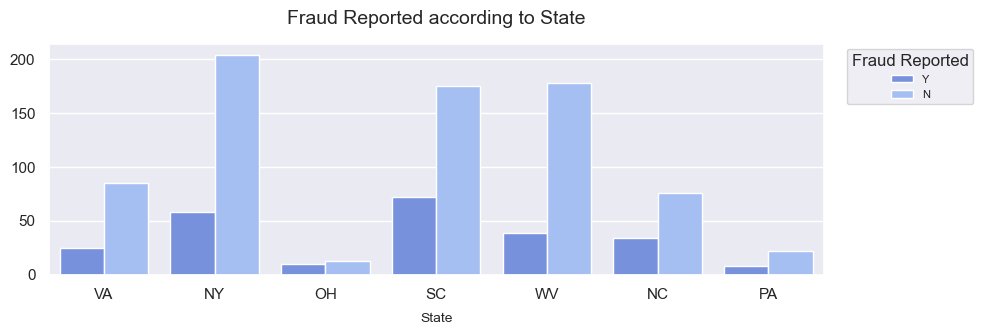

In [97]:
# Compare (12) <incident_state> vs Fraud Reported
col = 'incident_state'
plot_counts_by_fraud_reported(col, xlabel='State', figsize=(10,3), show_perc=True )

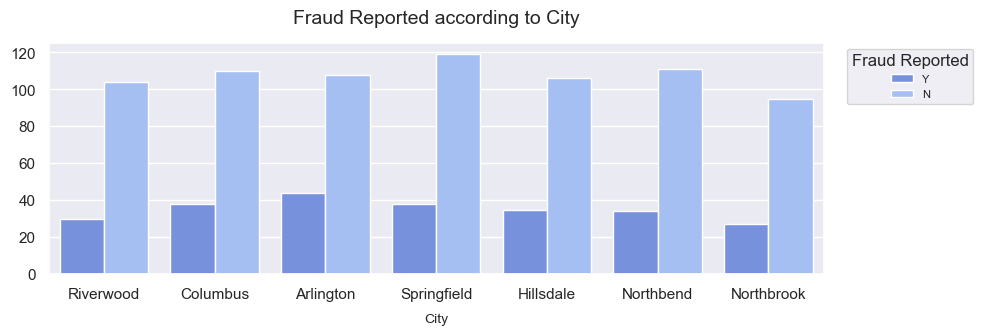

In [98]:
# Compare (13) <incident_city> vs Fraud Reported
col = 'incident_city'
plot_counts_by_fraud_reported(col, xlabel='City', figsize=(10,3), show_perc=True )

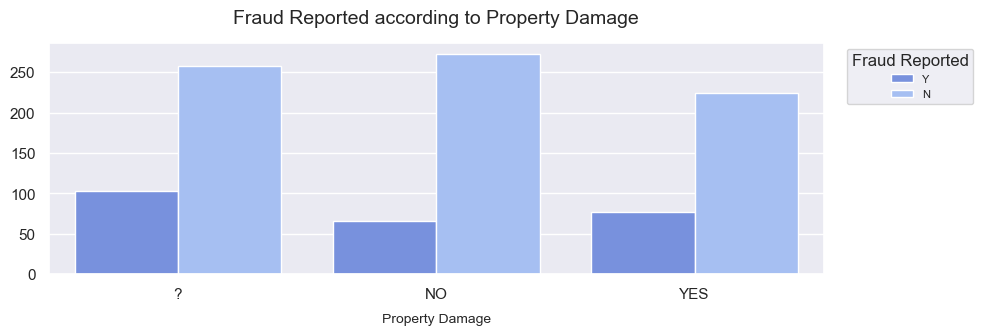

In [99]:
# Compare (14) <property_damage> vs Fraud Reported
col = 'property_damage'
plot_counts_by_fraud_reported(col, xlabel='Property Damage', figsize=(10,3), show_perc=True )

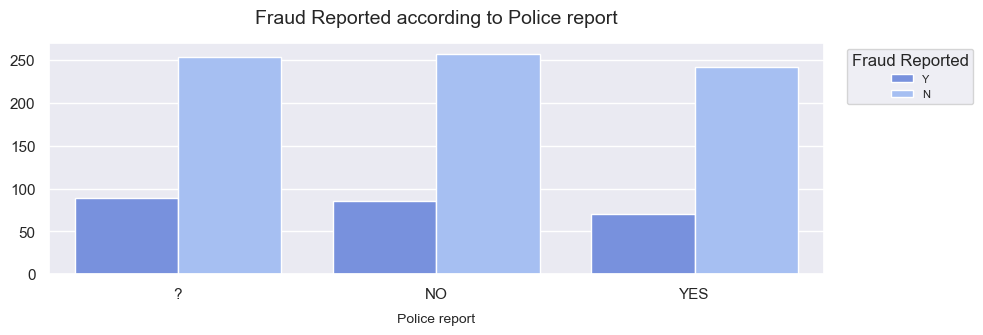

In [100]:
# Compare (15) <police_report_available> vs Fraud Reported
col = 'police_report_available'
plot_counts_by_fraud_reported(col, xlabel='Police report', figsize=(10,3), show_perc=True )

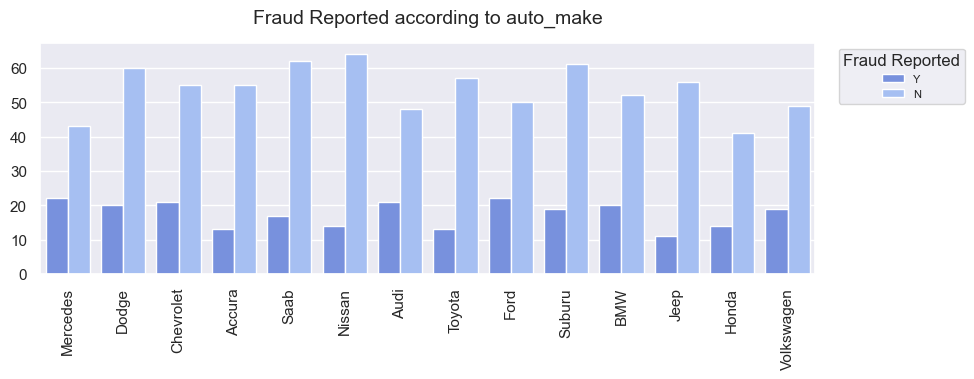

In [101]:
# Compare (16) <auto_make> vs Fraud Reported
col = 'auto_make'
plot_counts_by_fraud_reported(col, xlabel='', figsize=(10,3), show_perc=True, rot=90 )

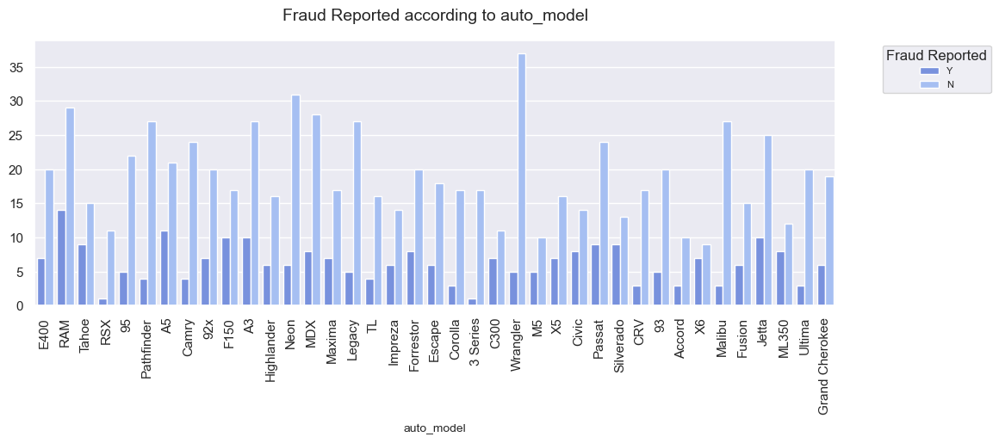

In [102]:
# Compare (17) <auto_model> vs Fraud Reported
col = 'auto_model'
plot_counts_by_fraud_reported(col, xlabel='auto_model', figsize=(12,4), show_perc=False, rot=90 )

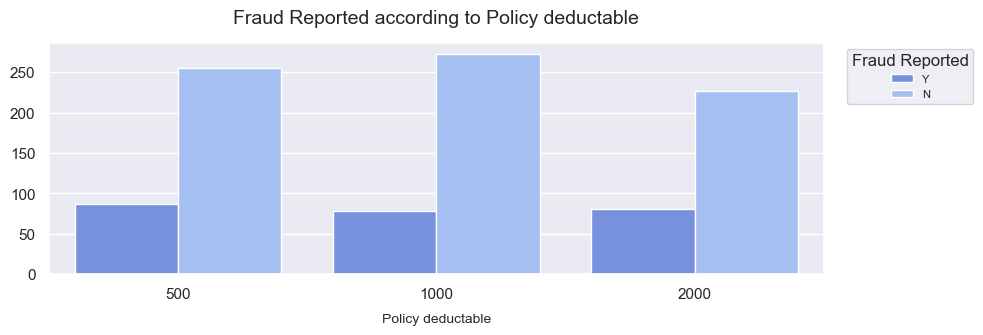

In [103]:
# Compare (18) <policy_deductable> vs Fraud Reported
col = 'policy_deductable'
plot_counts_by_fraud_reported(col, xlabel='Policy deductable', figsize=(10,3), show_perc=True )

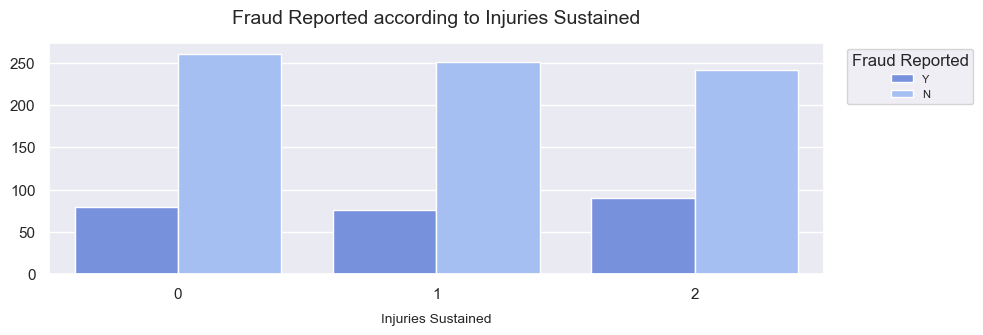

In [104]:
# Compare (19) <bodily_injuries> vs Fraud Reported
col = 'bodily_injuries'
plot_counts_by_fraud_reported(col, xlabel='Injuries Sustained', figsize=(10,3), show_perc=True )

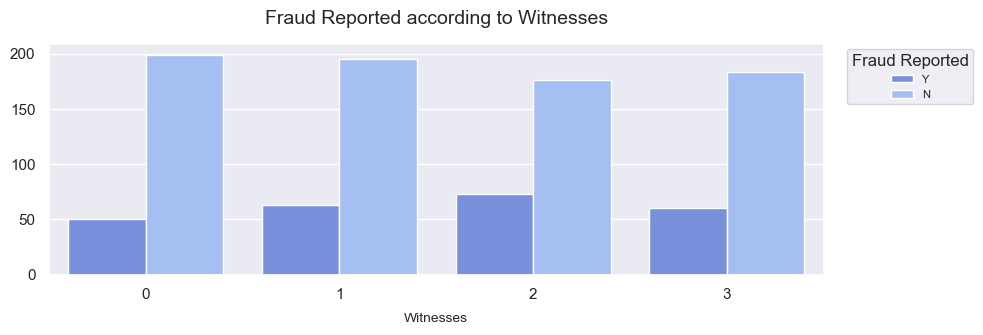

In [105]:
# Compare (20) <witnesses> vs Fraud Reported
col = 'witnesses'
plot_counts_by_fraud_reported(col, xlabel='Witnesses', figsize=(10,3), show_perc=True )

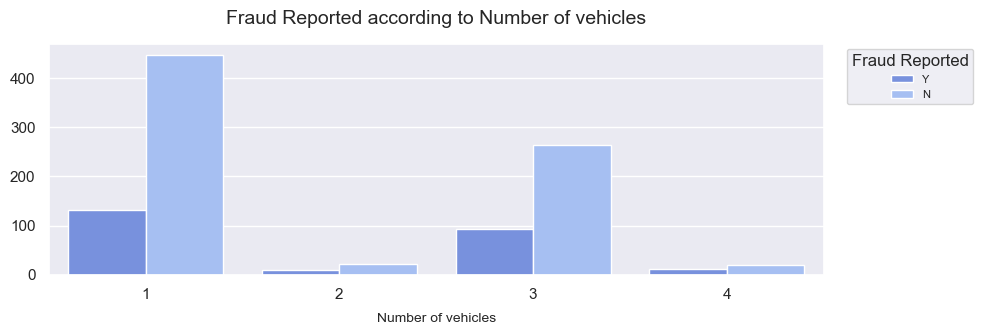

In [106]:
# Compare (21) <number_of_vehicles_involved> vs Fraud Reported
col = 'number_of_vehicles_involved'
plot_counts_by_fraud_reported(col, xlabel='Number of vehicles', figsize=(10,3), show_perc=True )

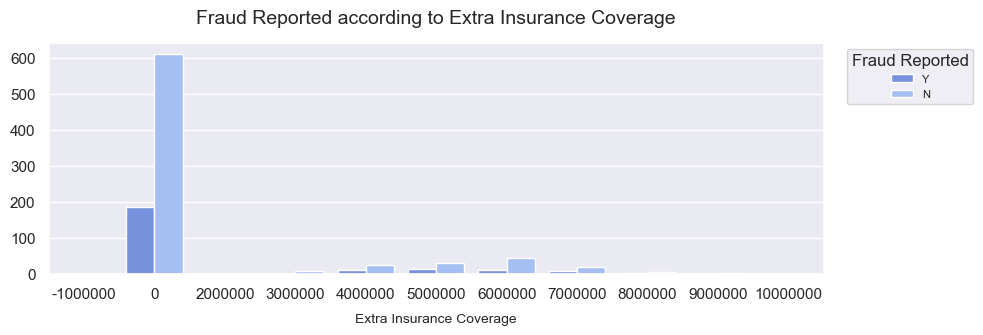

In [107]:
# Compare (22) <umbrella_limit> vs Fraud Reported
col = 'umbrella_limit'
plot_counts_by_fraud_reported(col, xlabel='Extra Insurance Coverage', figsize=(10,3), show_perc=True )

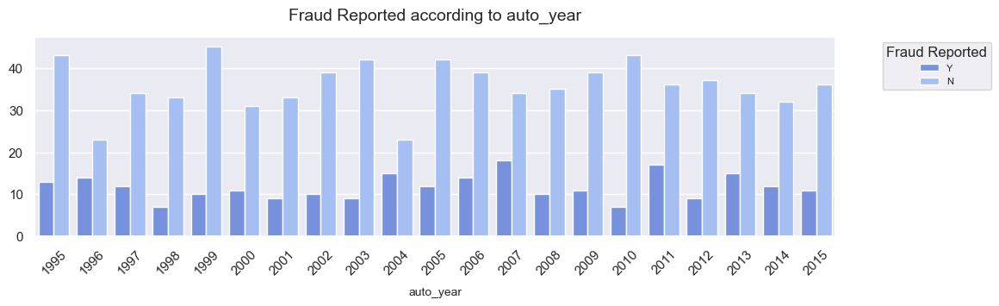

In [108]:
# Compare (23) <auto_year> vs Fraud Reported
col = 'auto_year'
plot_counts_by_fraud_reported(col, xlabel='auto_year', figsize=(12,3), show_perc=False, rot=45 )

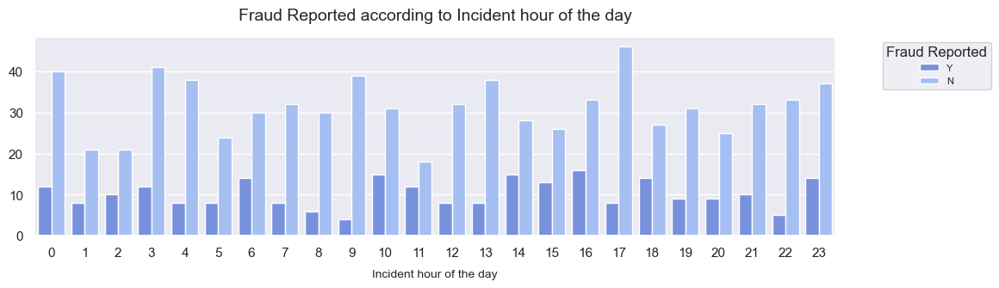

In [109]:
# Compare (24) <incident_hour_of_the_day> vs Fraud Reported
col = 'incident_hour_of_the_day'
plot_counts_by_fraud_reported(col, xlabel='Incident hour of the day', figsize=(12,3), show_perc=True, rot=0 )

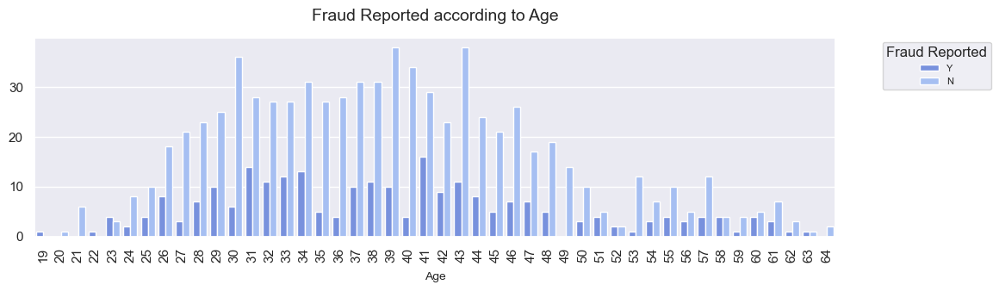

In [110]:
# Compare (25) <age> vs Fraud Reported
col = 'age'
plot_counts_by_fraud_reported(col, xlabel='Age', figsize=(12,3), show_perc=False, rot=90 )

We will create new columns from the incident_date variable, and then drop it.

In [111]:
df['year'] = df['incident_date'].dt.year
df['month'] = df['incident_date'].dt.month
df['day'] = df['incident_date'].dt.day

In [112]:
# Group by incident_severity, year, month, and fraud_reported, and calculate the mean for each numeric column.
incident_severity_by_month_year = df.groupby(['incident_severity','year', 'month','fraud_reported'], as_index=False).mean()
incident_severity_by_month_year.drop(['auto_year','day'], axis=1, inplace=True)
incident_severity_by_month_year['incident_date'] = pd.to_datetime(incident_severity_by_month_year[['year', 'month']].assign(day=1))
incident_severity_by_month_year

,incident_severity,year,month,fraud_reported,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,incident_date
0,Major Damage,2015,1,N,207.025641,40.025641,1076.923077,1200.168718,3.589744e+05,21271.794872,-22320.512821,12.384615,2.102564,0.820513,1.282051,64118.717949,9954.358974,9321.025641,44843.333333,2015-01-01
1,Major Damage,2015,1,Y,192.538462,38.184615,1146.153846,1319.025077,1.046154e+06,22401.538462,-23090.769231,11.907692,1.984615,0.984615,1.523077,65032.000000,8576.461538,10036.307692,46419.230769,2015-01-01
2,Major Damage,2015,2,N,212.463415,40.073171,1109.756098,1242.820244,7.073171e+05,22112.195122,-20156.097561,12.975610,2.170732,0.878049,1.780488,62713.902439,8973.170732,8232.926829,45507.804878,2015-02-01
3,Major Damage,2015,2,Y,207.452381,38.500000,1178.571429,1205.100000,1.523810e+06,20347.619048,-30150.000000,12.928571,1.976190,1.095238,1.714286,63707.380952,8820.000000,8725.000000,46162.380952,2015-02-01
4,Major Damage,2015,3,N,216.333333,36.666667,1333.333333,1268.163333,1.666667e+06,21900.000000,0.000000,7.666667,2.333333,1.333333,2.666667,60193.333333,8760.000000,7940.000000,43493.333333,2015-03-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72,Trivial Damage,2015,6,N,285.000000,47.000000,1000.000000,1216.680000,0.000000e+00,55100.000000,0.000000,8.000000,1.000000,1.000000,1.000000,2700.000000,300.000000,300.000000,2100.000000,2015-06-01
73,Trivial Damage,2015,9,N,292.000000,45.000000,1000.000000,1358.910000,0.000000e+00,0.000000,0.000000,4.000000,1.000000,0.000000,2.000000,7370.000000,670.000000,1340.000000,5360.000000,2015-09-01
74,Trivial Damage,2015,10,N,104.750000,31.250000,875.000000,1250.112500,0.000000e+00,13050.000000,-20225.000000,8.750000,1.000000,1.250000,1.750000,5477.500000,947.500000,670.000000,3860.000000,2015-10-01
75,Trivial Damage,2015,11,N,112.000000,32.000000,1000.000000,1238.920000,0.000000e+00,57800.000000,-53700.000000,4.000000,1.000000,0.000000,2.000000,5060.000000,460.000000,920.000000,3680.000000,2015-11-01


In [113]:
# Define the function that plot the feature <col> over the time by incident_severityc

def plot_by_category_over_time(col, by_category, category_col, data, category_order, title, figsize, sharey=False):
    ''' Plot over time considering <incident_date> that refers to the date which claims where made by customers.
     - data: should be group_by <by_category, year, month, category_col>
    '''
    # Style settings
    sns.set_style('whitegrid')
    sns.set(font_scale=1.5)  

    # Filter the locations with non-null values
    df_no_missings = data[~data[col].isna()]

    n_plots = df_no_missings[by_category].nunique()
    fig, axes = plt.subplots(n_plots, 1, figsize=figsize, sharey=sharey)

    for i, loc in enumerate(df_no_missings[by_category].unique()):
        df_loc = df_no_missings[df_no_missings[by_category]==loc]

        # line plot for the Sunshine by location 
        plot = sns.lineplot(x='incident_date', y=col, data=df_loc, ax=axes[i], hue=category_col, hue_order=category_order)

        axes[i].set_ylabel('', size=10, labelpad=8)
        axes[i].set_xlabel('', size=10, labelpad=8)
        axes[i].set_title(f'{title} Over time in {loc}', size=16, y=1)

    plt.show()
    return [df_no_missings, plot]

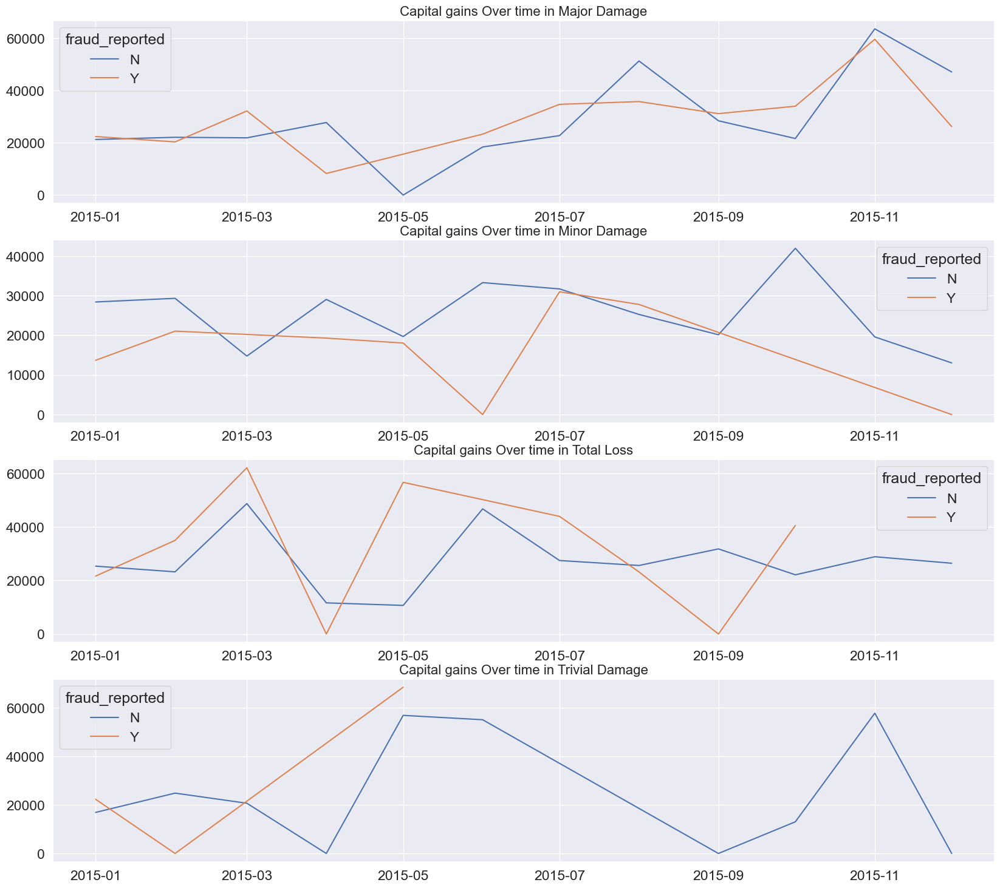

In [114]:
# Plot Capital gains over time by incident_severity
col = 'capital-gains'
title='Capital gains'
by_category='incident_severity'
category_col='fraud_reported'
data=incident_severity_by_month_year
category_order=['N','Y']
title
figsize=(20,18)

df_result, plot = plot_by_category_over_time(col, by_category, category_col, data, category_order, title, figsize, sharey=False)

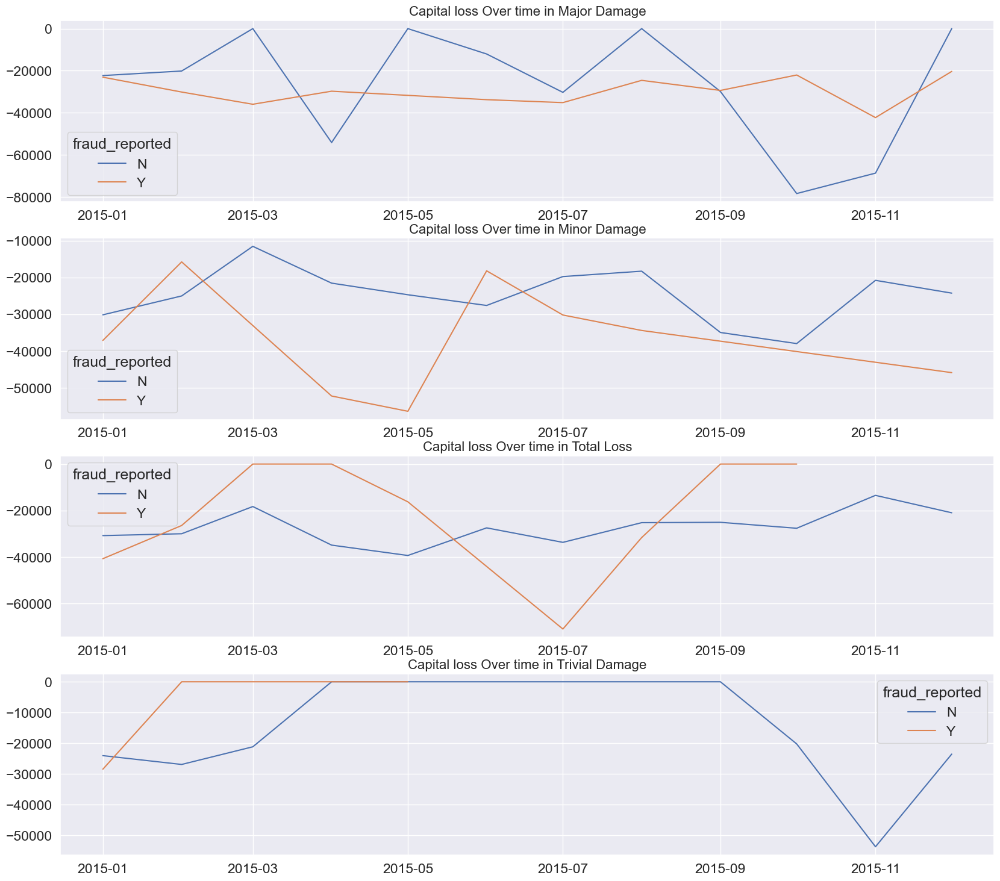

In [115]:
# Plot Capital loss over time by incident_severity
col = 'capital-loss'
title='Capital loss'
by_category='incident_severity'
category_col='fraud_reported'
data=incident_severity_by_month_year
category_order=['N','Y']
title
figsize=(20,18)

df_result, plot = plot_by_category_over_time(col, by_category, category_col, data, category_order, title, figsize, sharey=False)

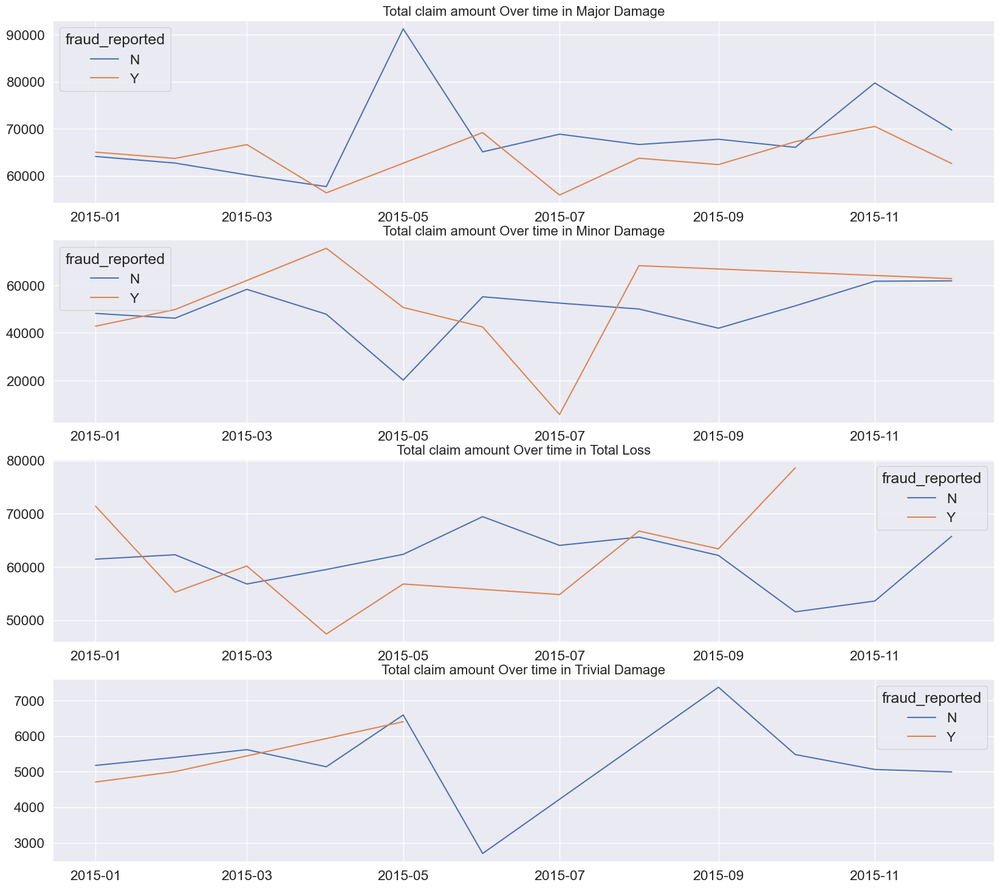

In [116]:
# Plot Total claim amount over time by incident_severity
col = 'total_claim_amount'
title='Total claim amount'
by_category='incident_severity'
category_col='fraud_reported'
data=incident_severity_by_month_year
category_order=['N','Y']
title
figsize=(20,18)

df_result, plot = plot_by_category_over_time(col, by_category, category_col, data, category_order, title, figsize, sharey=False)

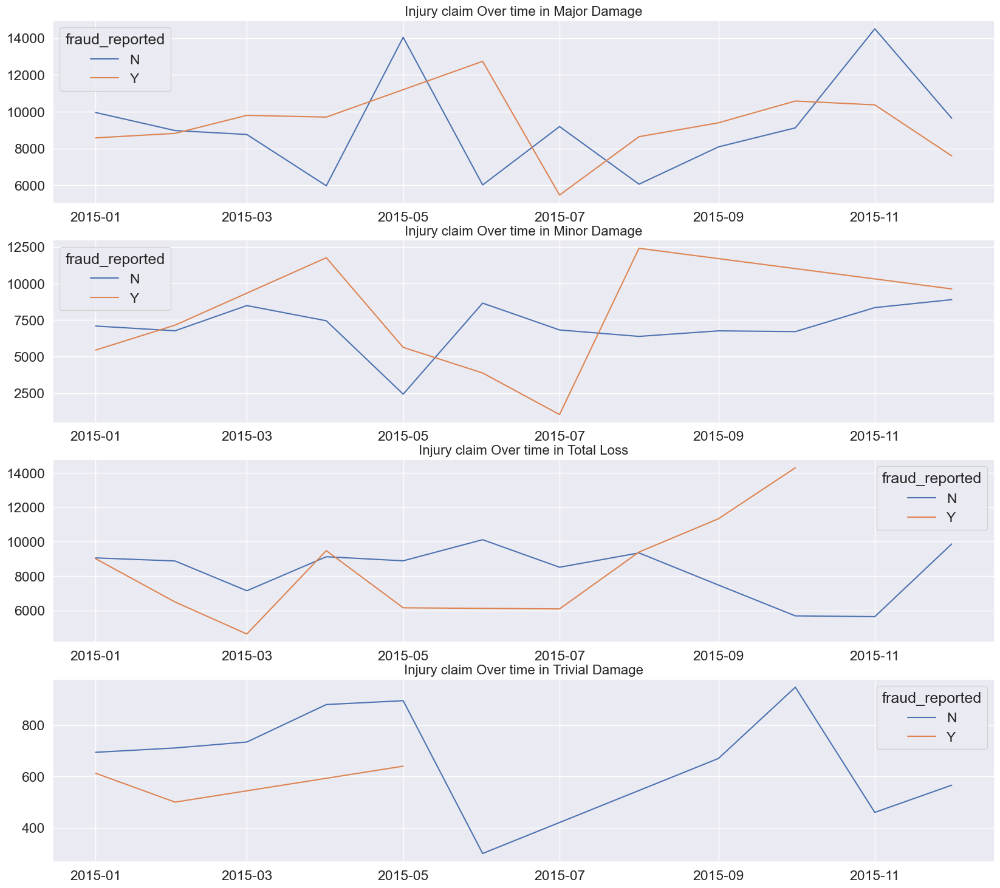

In [117]:
# Plot Injury claim over time by incident_severity
col = 'injury_claim'
title='Injury claim'
by_category='incident_severity'
category_col='fraud_reported'
data=incident_severity_by_month_year
category_order=['N','Y']
title
figsize=(20,18)

df_result, plot = plot_by_category_over_time(col, by_category, category_col, data, category_order, title, figsize, sharey=False)

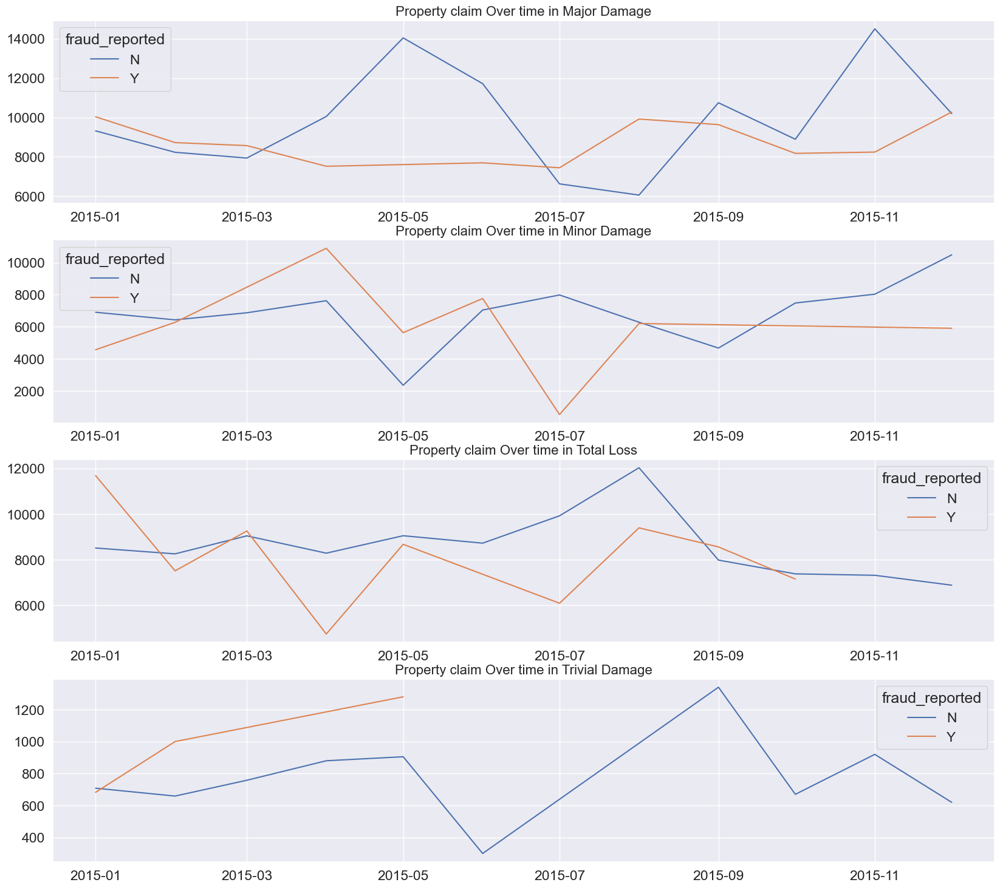

In [118]:
# Plot Property claim over time by incident_severity
col = 'property_claim'
title='Property claim'
by_category='incident_severity'
category_col='fraud_reported'
data=incident_severity_by_month_year
category_order=['N','Y']
title
figsize=(20,18)

df_result, plot = plot_by_category_over_time(col, by_category, category_col, data, category_order, title, figsize, sharey=False)

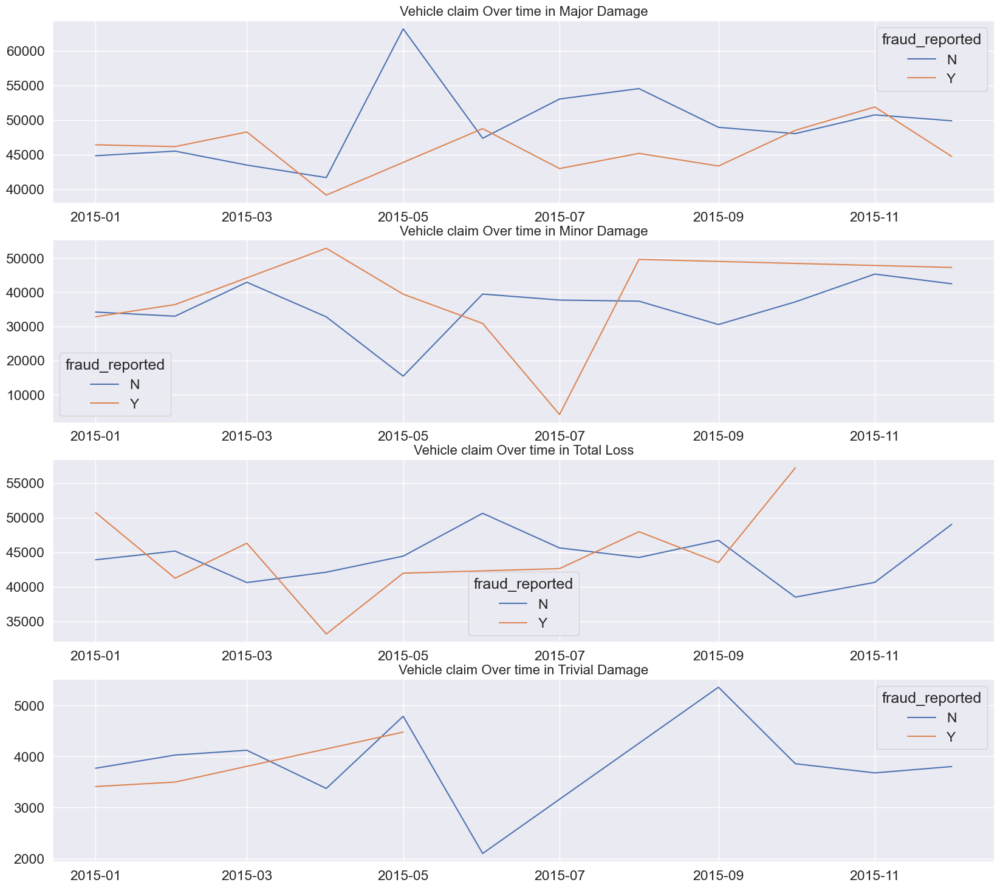

In [119]:
# Plot Vehicle claim over time by incident_severity
col = 'vehicle_claim'
title='Vehicle claim'
by_category='incident_severity'
category_col='fraud_reported'
data=incident_severity_by_month_year
category_order=['N','Y']
title
figsize=(20,18)

df_result, plot = plot_by_category_over_time(col, by_category, category_col, data, category_order, title, figsize, sharey=False)

In [120]:
# hue = ['incident_type', 'incident_severity', 'collision_type', 'policy_deductable']

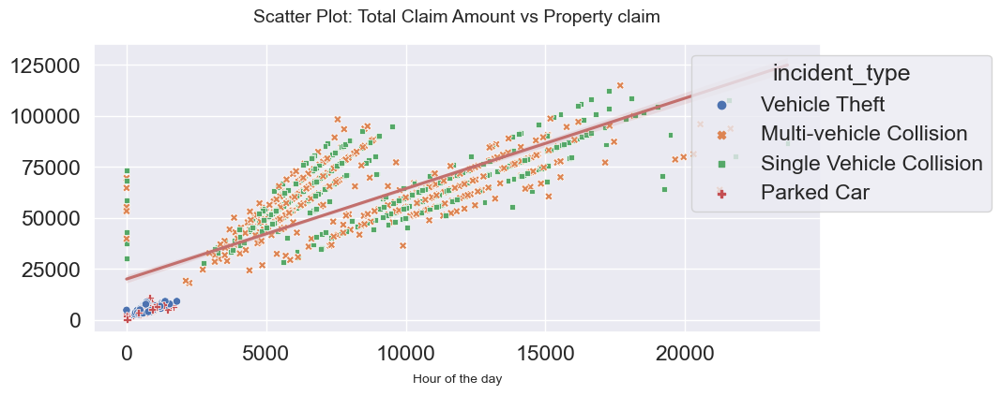

In [121]:
colx = 'property_claim'
coly = 'total_claim_amount'
col_hue = 'incident_type'
colors = ['#6e90bf', '#c26f6d']
xlabel, ylabel, title = ['Hour of the day','', f'Scatter Plot: Total Claim Amount vs Property claim']

plt.figure(figsize=(10, 4))
ax = sns.scatterplot(x=colx, y=coly, data=df[[colx,coly, col_hue]], hue=col_hue, style=col_hue)
sns.regplot(x=colx, y=coly, data=df, scatter=False, ax=ax, color=colors[1])

plt.xlabel(xlabel, size=10, labelpad=8)
plt.ylabel(ylabel, size=10, labelpad=8)
plt.legend(loc='upper right', bbox_to_anchor=(1.25, 1)).set_title(col_hue)

plt.title(title, size=14, y=1.05);

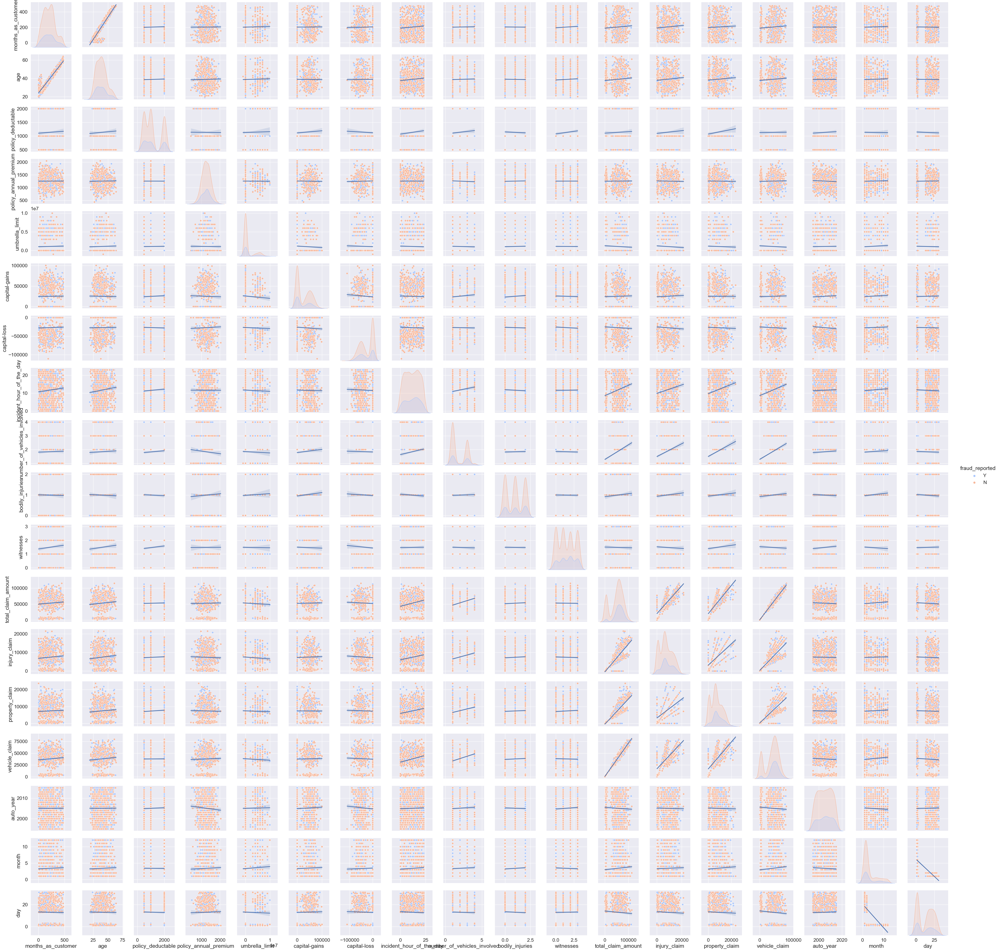

In [122]:
sns.set(font_scale=1.5)  
grid = sns.pairplot(df.drop(['year'],axis=1), hue='fraud_reported', palette = "coolwarm")

# Add a regression line for non-diagonal plots
for ax in grid.axes.flat[1:-1]: # first and last axes are not considered
    if ax.get_xlabel() != ax.get_ylabel():
        sns.regplot(data=df, x=ax.get_xlabel(), y=ax.get_ylabel(), scatter=False, ax=ax, color='b')

plt.show()

There is a positive correlation between:

Age and months_as_customer
vehicle_claim, property_claim, injury_claim, and total_claim_amount

In [123]:
df['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

In [124]:
df['fraud_reported'] = df['fraud_reported'].map({'Y': 1, 'N': 0})
df.head()


,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,year,month,day
0,228,42,2006-06-27,IN,250/500,2000,1197.22,5000000,MALE,MD,...,780,780,3510,Mercedes,E400,2007,1,2015,1,21
1,134,29,2000-06-09,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,...,7700,3850,23100,Dodge,RAM,2007,0,2015,2,22
2,256,41,1990-05-25,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,...,6340,6340,50720,Chevrolet,Tahoe,2014,1,2015,10,1
3,228,44,2014-06-06,IL,500/1000,1000,1583.91,6000000,MALE,Associate,...,1300,650,4550,Accura,RSX,2009,0,2015,2,17
4,256,39,2006-12-10,OH,250/500,1000,1351.10,0,FEMALE,PhD,...,6410,6410,51280,Saab,95,2003,1,2015,2,1


Additionally, since we already have the 'months_as_customer' column documenting the duration since the customer's insurance proposal acceptance ('policy_bind_date'), we can safely drop the latter column.

In [125]:
print(f"The column year has only {df.year.unique()} as unique value.")

The column year has only [2015] as unique value.


In [126]:
# Drop the Date column
df.drop(['incident_date','year','policy_bind_date'], axis=1, inplace=True)

In [127]:
# Calculate the correlation between features
cor = df.corr()
cor

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,fraud_reported,month,day
months_as_customer,1.000000,0.922018,0.027064,0.004355,0.016027,0.005314,0.019200,0.071746,0.015639,-0.010178,0.057924,0.061389,0.065572,0.033725,0.060256,-0.000094,0.018699,0.025474,-0.012339
age,0.922018,1.000000,0.029423,0.013801,0.018613,-0.008086,0.006428,0.088194,0.022938,-0.015696,0.051932,0.069206,0.075749,0.059812,0.061892,0.001536,0.010433,0.024152,-0.007271
policy_deductable,0.027064,0.029423,1.000000,-0.003109,0.010764,0.035456,-0.023343,0.060752,0.051050,-0.022763,0.066750,0.023005,0.039066,0.065097,0.005438,0.026065,0.015230,-0.006583,-0.017918
policy_annual_premium,0.004355,0.013801,-0.003109,1.000000,-0.005953,-0.014373,0.022973,-0.000989,-0.045507,0.026779,0.002047,0.008657,-0.017519,-0.012384,0.019793,-0.049123,-0.015584,0.022023,0.014142
umbrella_limit,0.016027,0.018613,0.010764,-0.005953,1.000000,-0.046812,-0.023611,-0.023729,-0.021675,0.022750,-0.006518,-0.040016,-0.045509,-0.023249,-0.038240,0.009807,0.059557,0.042073,-0.021184
capital-gains,0.005314,-0.008086,0.035456,-0.014373,-0.046812,1.000000,-0.047916,-0.015453,0.062530,0.055848,-0.018130,0.015269,0.026139,-0.001961,0.015089,0.031600,-0.020983,0.030177,0.014279
capital-loss,0.019200,0.006428,-0.023343,0.022973,-0.023611,-0.047916,1.000000,-0.024163,-0.014120,-0.024439,-0.041794,-0.036768,-0.045901,-0.024004,-0.033405,-0.056467,-0.016563,0.023935,-0.016143
incident_hour_of_the_day,0.071746,0.088194,0.060752,-0.000989,-0.023729,-0.015453,-0.024163,1.000000,0.120101,-0.034570,0.006973,0.218542,0.165666,0.180857,0.216503,0.021202,0.005999,0.044155,-0.026902
number_of_vehicles_involved,0.015639,0.022938,0.051050,-0.045507,-0.021675,0.062530,-0.014120,0.120101,1.000000,0.014043,-0.014294,0.275030,0.224574,0.220270,0.270179,0.034415,0.053378,0.031957,-0.017748
bodily_injuries,-0.010178,-0.015696,-0.022763,0.026779,0.022750,0.055848,-0.024439,-0.034570,0.014043,1.000000,-0.005611,0.047098,0.047321,0.039765,0.043454,-0.020526,0.033911,0.047055,-0.032094


In [128]:
 Listing the correlation coeficients with the target variable 
corr_df = cor.unstack().sort_values(ascending=False).reset_index()
corr_df.columns = ['Feature A', 'Feature B', 'Corr coef']
corr_df[(corr_df['Feature A'] == 'fraud_reported') ]

SyntaxError: invalid syntax (111682370.py, line 1)

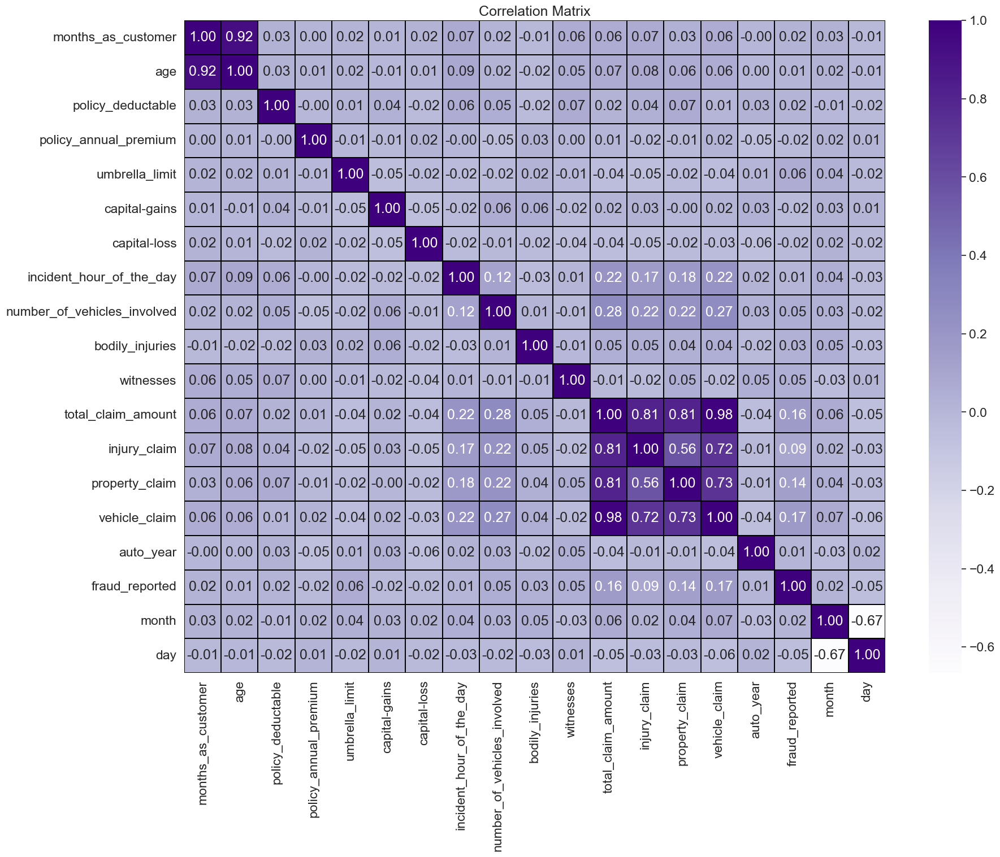

In [129]:
# Visualizing the correlation matrix by plotting heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(cor, linewidths = 0.1, fmt = ".2f", linecolor = 'black', cmap='Purples', annot=True)
plt.yticks(rotation = 0)
plt.title('Correlation Matrix')
plt.show()

The heatmap displays both positive and negative correlations.
The target variable shows low correlation with total_claim_amount (+0.16), vehicle_claim (+0.17), and property_claim (+0.14).
Age exhibits a high correlation with months_as_customer (+0.92).
Total_claim_amount is strongly correlated with injury_claim(+0.81), property_claim(+0.81), and vehicle_claim(+0.98).
Month demonstrates a high negative correlation with day (-0.67).
The number_of_vehicles_involved moderately correlates with total_claim_amount (+0.27).

In [130]:
# Replacing all occurrences of '?' with np.NaN 
df = df.replace('?', np.NaN)

In [131]:
# checking the null values
missing_val = df.isnull().sum().to_frame("Null values")

# Calculate the % of the null values
missing_val["% of missing"] = round(missing_val['Null values'] / len(df) * 100,2)
missing_val = missing_val.sort_values(by='% of missing', ascending=False)

# List only columns with missing values
missing_val[missing_val['% of missing']>0]

,Null values,% of missing
property_damage,360,36.04
police_report_available,343,34.33
collision_type,178,17.82


In [132]:
df_backup = df.copy()

In [133]:
cols_more_than_thr = missing_val[missing_val['% of missing'] > 0].index.to_list()
cols_more_than_thr

['property_damage', 'police_report_available', 'collision_type']

In [134]:
# listing the possible imputation values 
for col in cols_more_than_thr:
    print(f"Column = {col} Mode = {df[col].mode()[0]}")

Column = property_damage Mode = NO
Column = police_report_available Mode = NO
Column = collision_type Mode = Rear Collision


In [135]:
from scipy.stats import mode

def calculate_mode(x, col):
    ''' calculate the mode for <x>. If there is no value return the mode for the column <col>'''
    mode_result = pd.Series.mode(x)
    return mode_result.iloc[0] if not mode_result.empty else df[col].mode()[0]

impu_val = {}

# Define Columns to group the data
group_col = ['incident_type','fraud_reported']

# Impute missing values of categorical columns with the mode according to 'fraud_reported' and 'incident_type'.
for col in cols_more_than_thr:
    impu_val[col] = {name: calculate_mode(group[col],col) for name, group in df.groupby(group_col)}
    print(f"Impute the missing values in {col} with the mode:")
    display(impu_val[col])

    # Fill missing values with the mode 
    print(f"Missing values in {col} to impute: {df[col].isnull().sum()}")    
    df[col] = df[col].fillna(df.apply(lambda row: impu_val[col].get((row['incident_type'], row['fraud_reported']), row[col]), axis=1))
    print(f"Missing values remaining in {col}: {df[col].isnull().sum()}\n")

Impute the missing values in property_damage with the mode:


{('Multi-vehicle Collision', 0): 'NO',
 ('Multi-vehicle Collision', 1): 'NO',
 ('Parked Car', 0): 'NO',
 ('Parked Car', 1): 'YES',
 ('Single Vehicle Collision', 0): 'NO',
 ('Single Vehicle Collision', 1): 'YES',
 ('Vehicle Theft', 0): 'NO',
 ('Vehicle Theft', 1): 'NO'}

Missing values in property_damage to impute: 360
Missing values remaining in property_damage: 0

Impute the missing values in police_report_available with the mode:


{('Multi-vehicle Collision', 0): 'NO',
 ('Multi-vehicle Collision', 1): 'NO',
 ('Parked Car', 0): 'NO',
 ('Parked Car', 1): 'NO',
 ('Single Vehicle Collision', 0): 'YES',
 ('Single Vehicle Collision', 1): 'NO',
 ('Vehicle Theft', 0): 'NO',
 ('Vehicle Theft', 1): 'NO'}

Missing values in police_report_available to impute: 343
Missing values remaining in police_report_available: 0

Impute the missing values in collision_type with the mode:


{('Multi-vehicle Collision', 0): 'Side Collision',
 ('Multi-vehicle Collision', 1): 'Rear Collision',
 ('Parked Car', 0): 'Rear Collision',
 ('Parked Car', 1): 'Rear Collision',
 ('Single Vehicle Collision', 0): 'Rear Collision',
 ('Single Vehicle Collision', 1): 'Front Collision',
 ('Vehicle Theft', 0): 'Rear Collision',
 ('Vehicle Theft', 1): 'Rear Collision'}

Missing values in collision_type to impute: 178
Missing values remaining in collision_type: 0



In [136]:
df.isnull().sum().sum()

0

In [137]:
 # Checking the unique values of the categorical independent variables
encoding_col = categorical_col[:-1]
    
for i, col in enumerate(encoding_col):
    print(f"{i+1}.{col}:\n  {df[col].unique()}\n")

1.policy_state:
  ['IN' 'OH' 'IL']

2.policy_csl:
  ['250/500' '100/300' '500/1000']

3.insured_sex:
  ['MALE' 'FEMALE']

4.insured_education_level:
  ['MD' 'PhD' 'Associate' 'Masters' 'High School' 'College' 'JD']

5.insured_occupation:
  ['machine-op-inspct' 'sales' 'armed-forces' 'tech-support'
 'prof-specialty' 'other-service' 'priv-house-serv' 'exec-managerial'
 'protective-serv' 'transport-moving' 'craft-repair' 'handlers-cleaners'
 'adm-clerical' 'farming-fishing']

6.insured_hobbies:
  ['reading' 'board-games' 'bungie-jumping' 'base-jumping' 'golf' 'camping'
 'dancing' 'skydiving' 'movies' 'hiking' 'yachting' 'paintball' 'chess'
 'kayaking' 'polo' 'basketball' 'video-games' 'sleeping' 'cross-fit'
 'exercise']

7.insured_relationship:
  ['other-relative' 'own-child' 'unmarried' 'husband' 'wife' 'not-in-family']

8.incident_type:
  ['Vehicle Theft' 'Multi-vehicle Collision' 'Single Vehicle Collision'
 'Parked Car']

9.collision_type:
  ['Rear Collision' 'Front Collision' 'Side Co

In [138]:
from sklearn.preprocessing import LabelEncoder

category_mappings = {}

# Initialize the LabelEncoder
label_encoder = LabelEncoder()
for col in encoding_col:
    df[col] = label_encoder.fit_transform(df[col])
    
    # Store the mapping in a dictionary
    category_mappings[col] = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
    print(col,'\n', category_mappings[col],'\n')
    
display(df.head())
display(df.tail())

policy_state 
 {'IL': 0, 'IN': 1, 'OH': 2} 

policy_csl 
 {'100/300': 0, '250/500': 1, '500/1000': 2} 

insured_sex 
 {'FEMALE': 0, 'MALE': 1} 

insured_education_level 
 {'Associate': 0, 'College': 1, 'High School': 2, 'JD': 3, 'MD': 4, 'Masters': 5, 'PhD': 6} 

insured_occupation 
 {'adm-clerical': 0, 'armed-forces': 1, 'craft-repair': 2, 'exec-managerial': 3, 'farming-fishing': 4, 'handlers-cleaners': 5, 'machine-op-inspct': 6, 'other-service': 7, 'priv-house-serv': 8, 'prof-specialty': 9, 'protective-serv': 10, 'sales': 11, 'tech-support': 12, 'transport-moving': 13} 

insured_hobbies 
 {'base-jumping': 0, 'basketball': 1, 'board-games': 2, 'bungie-jumping': 3, 'camping': 4, 'chess': 5, 'cross-fit': 6, 'dancing': 7, 'exercise': 8, 'golf': 9, 'hiking': 10, 'kayaking': 11, 'movies': 12, 'paintball': 13, 'polo': 14, 'reading': 15, 'skydiving': 16, 'sleeping': 17, 'video-games': 18, 'yachting': 19} 

insured_relationship 
 {'husband': 0, 'not-in-family': 1, 'other-relative': 2, 'own-ch

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
0,228,42,1,1,2000,1197.22,5000000,1,4,6,...,5070,780,780,3510,8,12,2007,1,1,21
1,134,29,2,0,2000,1413.14,5000000,0,6,11,...,34650,7700,3850,23100,4,30,2007,0,2,22
2,256,41,0,1,2000,1415.74,6000000,0,6,1,...,63400,6340,6340,50720,3,34,2014,1,10,1
3,228,44,0,2,1000,1583.91,6000000,1,0,11,...,6500,1300,650,4550,0,31,2009,0,2,17
4,256,39,2,1,1000,1351.10,0,0,6,12,...,64100,6410,6410,51280,10,3,2003,1,2,1


,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
994,3,38,2,2,1000,1310.80,0,0,5,2,...,87200,17440,8720,61040,6,6,2006,0,2,22
995,285,41,0,0,1000,1436.79,0,0,6,9,...,108480,18080,18080,72320,13,28,2015,0,1,24
996,130,34,2,1,500,1383.49,3000000,0,5,1,...,67500,7500,7500,52500,11,19,1996,0,1,23
997,458,62,0,2,2000,1356.92,5000000,1,0,5,...,46980,5220,5220,36540,1,5,1998,0,2,26
998,456,60,2,1,1000,766.19,0,0,0,11,...,5060,460,920,3680,8,12,2007,0,2,26


In [139]:
df_backup2 = df.copy()

In [145]:
# Detect outliers with zscore method
from scipy.stats import zscore

z = np.abs(zscore(df))
z


,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
0,0.210091,0.335062,0.015671,0.060967,1.411889,0.241829,1.696847,1.078118,0.531272,0.163745,...,1.806155,1.363354,1.371776,1.822197,0.361348,0.659683,0.315155,1.749564,0.735606,0.759645
1,0.606972,1.087912,1.188606,1.182018,1.411889,0.642651,1.696847,0.927543,1.557849,1.081167,...,0.685479,0.054428,0.735038,0.784642,0.630374,0.958876,0.315155,0.571571,0.430301,0.855463
2,0.453472,0.225603,1.219948,0.060967,1.411889,0.653301,2.132170,0.927543,1.557849,1.408657,...,0.403751,0.224211,0.218595,0.678209,0.878305,1.318556,1.478765,1.749564,2.012145,1.156731
3,0.210091,0.553982,1.219948,1.303953,0.222499,1.342181,2.132170,1.078118,1.521882,1.081167,...,1.751977,1.256815,1.398739,1.767115,1.622096,1.048796,0.647615,0.571571,0.430301,0.376369
4,0.453472,0.006684,1.188606,0.060967,0.222499,0.388514,0.479771,0.927543,1.557849,1.330149,...,0.430272,0.209869,0.204077,0.707868,0.857209,1.468963,0.349765,1.749564,0.430301,1.156731
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,1.745645,0.102776,1.188606,1.303953,0.222499,0.223432,0.479771,0.927543,1.044560,1.159675,...,1.305444,2.049976,0.275033,1.224792,0.134513,1.199203,0.148925,0.571571,0.430301,0.855463
995,0.705544,0.225603,1.219948,1.182018,0.222499,0.739529,0.479771,0.927543,1.557849,0.583202,...,2.111664,2.181101,2.216360,1.822219,1.601001,0.779036,1.644995,0.571571,0.735606,1.047101
996,0.641741,0.540614,1.188606,0.060967,1.039694,0.521195,0.826200,0.927543,1.044560,1.408657,...,0.559085,0.013452,0.021997,0.772484,1.105140,0.030243,1.513376,0.571571,0.735606,0.951282
997,2.209288,2.524254,1.219948,1.303953,1.411889,0.412355,1.696847,1.078118,1.521882,0.412728,...,0.218341,0.453679,0.450891,0.072813,1.374166,1.289123,1.180916,0.571571,0.430301,1.238738


In [146]:
# threshold = 3
df_new = df[(z<3).all(axis=1)]

print(f"{df.shape[0] - df_new.shape[0]} rows with outliers were deleted.")
print(f"This represent {round((df.shape[0] - df_new.shape[0]) / df.shape[0] *100, 2)}% of the data.")
print(f"In the new dataset there are {df_new.shape[0]} rows and {df.shape[1]} columns.")
df_process = df_new.copy()
df_process

20 rows with outliers were deleted.
This represent 2.0% of the data.
In the new dataset there are 979 rows and 36 columns.


,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,month,day
0,228,42,1,1,2000,1197.22,5000000,1,4,6,...,5070,780,780,3510,8,12,2007,1,1,21
1,134,29,2,0,2000,1413.14,5000000,0,6,11,...,34650,7700,3850,23100,4,30,2007,0,2,22
2,256,41,0,1,2000,1415.74,6000000,0,6,1,...,63400,6340,6340,50720,3,34,2014,1,10,1
3,228,44,0,2,1000,1583.91,6000000,1,0,11,...,6500,1300,650,4550,0,31,2009,0,2,17
4,256,39,2,1,1000,1351.10,0,0,6,12,...,64100,6410,6410,51280,10,3,2003,1,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
994,3,38,2,2,1000,1310.80,0,0,5,2,...,87200,17440,8720,61040,6,6,2006,0,2,22
995,285,41,0,0,1000,1436.79,0,0,6,9,...,108480,18080,18080,72320,13,28,2015,0,1,24
996,130,34,2,1,500,1383.49,3000000,0,5,1,...,67500,7500,7500,52500,11,19,1996,0,1,23
997,458,62,0,2,2000,1356.92,5000000,1,0,5,...,46980,5220,5220,36540,1,5,1998,0,2,26


In [147]:
# Checking the skewness in the data
df_skew = df_process.skew().sort_values(ascending=False).to_frame("Skew")
df_skew

,Skew
umbrella_limit,1.799780
month,1.386927
fraud_reported,1.193134
property_damage,0.595540
number_of_vehicles_involved,0.508038
age,0.477893
policy_deductable,0.475207
capital-gains,0.469148
months_as_customer,0.365091
property_claim,0.363884


In [148]:
# Subsetting the features with a skew > 0.5
skew_columns = df_skew[abs(df_skew['Skew']) > 0.5].index.to_list()
skew_columns = sorted(skew_columns)
skew_columns

['fraud_reported',
 'month',
 'number_of_vehicles_involved',
 'property_damage',
 'total_claim_amount',
 'umbrella_limit',
 'vehicle_claim']

We are going to use the cube-root method, square-root method, and log method to transform the columns with a skewness of more than 0.5. Later, we will compare the resulting skewness in order to select the best transform method.

In [149]:
# Checking skewness using cuberoot method and log method
skew_columns = ['total_claim_amount', 'vehicle_claim']
df_transformed = pd.DataFrame()

for col in skew_columns:
    df_transformed[f"{col}_cbrt"] = np.cbrt(df_process[col])
    df_transformed[f"{col}_log"] = np.log(df_process[col])
    df_transformed[f"{col}_sqrt"] = np.sqrt(df_process[col])
        
# Adding the other columns
df_transformed = pd.concat([df_transformed, df_process[skew_columns]], axis=1)

In [150]:
# Comparing which transform method give better results
df_comp = df_transformed.skew().sort_index(ascending=False).to_frame("Skewness")

# Reset the index and identify the feature
df_comp.reset_index(inplace=True)
df_comp['feature'] = df_comp['index'].str.extract(r'^(.*)_.*')
df_comp['Skewness_abs'] = abs(df_comp['Skewness'])

# Drop the records with no valid skewness
df_comp = df_comp[~df_comp.Skewness.isnull()]

# Find the indexes of the rows with the minimum 'Skewness_abs' values
min_indices = df_comp.groupby('feature')['Skewness_abs'].idxmin()

# Select the rows corresponding to the minimum values in Skewness_abs,
low_skewness = df_comp.loc[min_indices]
low_skewness

,index,Skewness,feature,Skewness_abs
7,total_claim_amount,-0.591936,total_claim,0.591936
4,total_claim_amount_sqrt,-1.130602,total_claim_amount,1.130602
3,vehicle_claim,-0.619285,vehicle,0.619285
0,vehicle_claim_sqrt,-1.145158,vehicle_claim,1.145158


In [151]:
df_process[skew_columns].skew().sort_values(ascending=False).to_frame("Skewness after transform")

,Skewness after transform
total_claim_amount,-0.591936
vehicle_claim,-0.619285


In [152]:
# Separating the independent and target variables into x and y 
x = df_process.drop('fraud_reported', axis=1)
y = df_process['fraud_reported']

print(f"Feature Dimension = {x.shape}")
print(f"Label Dimension = {y.shape}")

Feature Dimension = (979, 35)
Label Dimension = (979,)


In [153]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

# Scaling the data 
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)

display(x.head())

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,month,day
0,0.203834,0.330710,-0.023379,0.067266,1.411248,-0.247737,1.889536,1.073149,0.533250,-0.161501,...,-0.838218,-1.807641,-1.360527,-1.378053,-1.823508,0.356099,-0.653981,0.310131,-0.733972,0.759860
1,-0.611058,-1.085489,1.181263,-1.175250,1.411248,0.646264,1.889536,-0.931837,1.556881,1.083457,...,-0.838218,-0.684408,0.055840,-0.737090,-0.783735,-0.637123,0.965305,0.310131,-0.427811,0.855897
2,0.446567,0.221771,-1.228021,0.067266,1.411248,0.657030,2.361077,-0.931837,1.556881,-1.406460,...,-0.838218,0.407307,-0.222521,-0.217221,0.682243,-0.885429,1.325146,1.474057,2.021471,-1.160880
3,0.203834,0.548586,-1.228021,1.309782,-0.224764,1.353325,2.361077,1.073149,-1.514012,1.083457,...,-0.838218,-1.753340,-1.254094,-1.405195,-1.768308,-1.630346,1.055265,0.642681,-0.427811,0.375712
4,0.446567,0.003895,1.181263,0.067266,-0.224764,0.389392,-0.468169,-0.931837,1.556881,1.332449,...,-0.838218,0.433888,-0.208194,-0.202607,0.711966,0.852711,-1.463624,-0.354969,-0.427811,-1.160880


In [154]:
# Finding varience inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif['Features'] = x.columns
vif['VIF values'] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif = vif.sort_values(by='VIF values', ascending=False)

# listing the variables with VIF > 10
vif[vif['VIF values'] > 10]

,Features,VIF values
29,vehicle_claim,inf
28,property_claim,inf
27,injury_claim,inf
26,total_claim_amount,inf


After evaluating the VIF, we obtained infinite values (inf), indicating perfect or almost perfect multicollinearity between the variables, specifically:

vehicle_claim
property_claim
injury_claim
total_claim_amount

In [156]:
x_backup = x.copy() 

In [157]:
# Dropping the columns with multicollinearity
x = x.drop(['injury_claim','total_claim_amount'] , axis=1) 

In [158]:
vif = pd.DataFrame()
vif['Features'] = x.columns
vif['VIF values'] = [variance_inflation_factor(x.values, i) for i in range(len(x.columns))]

vif.sort_values(by='VIF values', ascending=False)

,Features,VIF values
1,age,6.894002
0,months_as_customer,6.882642
21,number_of_vehicles_involved,5.177151
14,incident_type,5.163806
27,vehicle_claim,2.507254
26,property_claim,2.243625
31,month,1.837788
32,day,1.835015
16,incident_severity,1.206430
25,police_report_available,1.115539


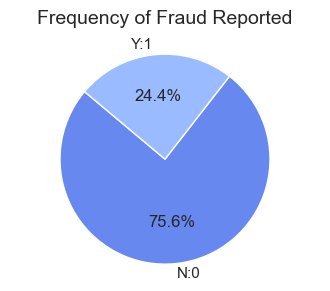

In [159]:
# Count the frequencies of target
target_counts = y.value_counts()

# Create a pie plot
sns.set(font_scale=1.0)
sns.set_palette('coolwarm')
plt.figure(figsize=(4, 3))
plt.pie(target_counts, labels=['N:0','Y:1'], autopct='%1.1f%%', startangle=140)

plt.title("Frequency of Fraud Reported", size=14, y=1.05)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [160]:
# Oversampling the data
from imblearn.over_sampling import SMOTE
SM = SMOTE()
x1, y1 = SM.fit_resample(x, y)

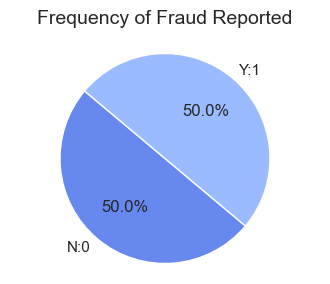

In [161]:
# Count the frequencies of target
target_counts = y1.value_counts()

# Create a pie plot
plt.figure(figsize=(4, 3))
plt.pie(target_counts, labels=['N:0','Y:1'], autopct='%1.1f%%', startangle=140)

plt.title("Frequency of Fraud Reported", size=14, y=1.05)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

In [162]:
X = x1
Y = y1

In [163]:
from sklearn.decomposition import PCA

# Step1: Scale and Balance the data
# Step2: Apply PCA
pca = PCA()
principal_components = pca.fit_transform(X)

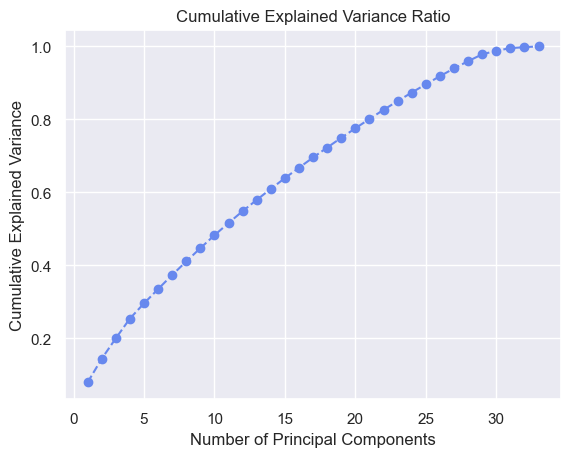

In [164]:
# Step 3: Extract Feature Importance
# The loadings attribute of PCA contains the weights of each original feature in each principal component.
loadings = pd.DataFrame(pca.components_, columns=X.columns)

# Visualize explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_
cumulative_variance_ratio = np.cumsum(explained_variance_ratio)

# Plot explained variance ratio
plt.plot(range(1, len(explained_variance_ratio) + 1), cumulative_variance_ratio, marker='o', linestyle='--')
plt.title('Cumulative Explained Variance Ratio')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')
plt.show()

In [165]:
# Display loadings to see feature importance
print("Loadings:")
display(loadings)

Loadings:


,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,...,bodily_injuries,witnesses,police_report_available,property_claim,vehicle_claim,auto_make,auto_model,auto_year,month,day
0,-0.058074,-0.075452,-0.019077,0.012405,-0.050936,0.039651,0.039841,-0.019563,-0.033765,-0.031334,...,-0.019267,-0.052554,0.041790,-0.385093,-0.402211,0.025888,-0.053501,-0.031060,-0.100915,0.077943
1,0.621051,0.618613,0.033608,0.001517,0.063079,0.075440,-0.019340,0.122169,-0.006329,-0.001017,...,-0.009436,0.059062,0.038338,0.050160,0.062040,0.023884,0.044335,-0.081587,0.100812,-0.105053
2,-0.221307,-0.231340,0.046545,-0.068910,-0.026248,-0.006449,0.059805,0.070585,0.014159,-0.006077,...,0.118171,-0.021353,0.127791,0.159917,0.176907,-0.099914,0.066507,-0.048573,0.492679,-0.484590
3,-0.059883,-0.053024,-0.013913,0.077568,0.030660,0.098549,-0.071395,-0.093873,-0.006812,-0.039820,...,-0.018344,0.084331,0.113205,0.301308,0.272819,-0.026902,-0.011142,-0.008480,-0.422409,0.422891
4,0.082229,0.058307,-0.147417,0.049618,-0.367500,-0.002057,-0.146618,-0.026340,0.158627,0.162408,...,0.014644,-0.252880,-0.141979,-0.022332,0.075433,0.380778,-0.302793,-0.294894,0.103986,-0.060067
5,-0.065941,-0.063828,0.239839,0.058888,0.184684,0.050779,-0.102938,0.318710,0.052692,-0.128595,...,-0.035635,0.225093,0.429723,-0.014299,-0.035177,0.432410,-0.367563,0.032314,0.069782,-0.006638
6,0.033113,0.041690,-0.253261,0.229253,-0.169930,-0.036193,0.417533,0.111030,0.247188,0.205837,...,0.309101,0.161418,-0.118619,0.111572,0.031012,0.174121,0.118588,0.270688,-0.021258,0.037774
7,0.038289,0.027034,-0.159977,-0.109988,0.156812,-0.106350,0.006966,0.221074,-0.242028,-0.380442,...,0.218395,0.042429,-0.365395,-0.206041,-0.190945,0.004461,-0.168799,0.130919,-0.000130,0.004158
8,0.022756,0.019667,0.213256,-0.083435,-0.025308,0.115229,-0.086687,-0.196329,-0.221925,0.088366,...,0.257187,-0.141856,0.031231,0.013238,-0.001764,0.023309,0.145908,-0.118194,0.035156,0.009354
9,-0.023552,-0.010548,-0.125860,0.064071,0.287024,-0.160643,-0.305170,-0.020518,0.396178,-0.044103,...,-0.214513,0.172351,0.074678,0.012670,-0.021939,-0.084766,0.213156,-0.003721,0.084672,-0.082554


In [166]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

def find_best_random_state(model, x, y):
    best_acc = 0
    best_random_state = 0

    for i in range(1,200):
        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=i)
        model.fit(x_train, y_train)
        y_pred = model.predict(x_test)
        acc = accuracy_score(y_test, y_pred)
        if acc > best_acc:
            best_acc = acc
            best_random_state = i
            
    return [best_random_state, best_acc]

In [167]:
# Build the model
model = RandomForestClassifier()
random_state, acc = find_best_random_state(model, X, Y) 
print(f"Best accuracy is {round(acc,4)} at random_state {random_state}")

Best accuracy is 0.9392 at random_state 113


In [168]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=random_state)
print("x_train shape: ", x_train.shape)
print("x_test shape:  ", x_test.shape)
print("y_train shape: ", y_train.shape)
print("y_test shape:  ", y_test.shape)

x_train shape:  (1036, 33)
x_test shape:   (444, 33)
y_train shape:  (1036,)
y_test shape:   (444,)


In [169]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier 
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score, StratifiedKFold

In [191]:
# Functions 
def calc_accuracy(model, id_model):
    ''' Calculate the accuracy of the model. Return the accuracy, training accuracy, and the predicted values.'''
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    
    acc = accuracy_score(y_test, y_pred)
    acc_train = model.score(x_train, y_train)
    
    print(f"\nModel: {id_model}")
    print(f"Confusion matrix: \n {confusion_matrix(y_test, y_pred)}")
    print(f"Classification report: \n {classification_report(y_test, y_pred)}" )
    print(f"Training Accuracy using {id_model} is {acc_train*100.0:.2f}%")
    print(f"The accuracy score using {id_model} is {round(acc*100.0, 2)}%")
    
    return [acc, acc_train, y_pred]

In [192]:
models = {'RandomForestClassifier' : RandomForestClassifier(), 
          'ExtraTreesClassifier': ExtraTreesClassifier(),
          'LogisticRegression': LogisticRegression(),
          'SVC': SVC(),
          'GradientBoostingClassifier': GradientBoostingClassifier(), 
          'AdaBoostClassifier': AdaBoostClassifier(), 
          'BaggingClassifier': BaggingClassifier()}

# Setting up for saving the results of each model
df_model_accuracy = pd.DataFrame(columns=['id','Model','Training Accuracy','Model Accuracy Score'])
y_pred = {}

In [193]:
id_model = 'RandomForestClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: RandomForestClassifier
Confusion matrix: 
 [[222  14]
 [ 14 194]]
Classification report: 
               precision    recall  f1-score   support

           0       0.94      0.94      0.94       236
           1       0.93      0.93      0.93       208

    accuracy                           0.94       444
   macro avg       0.94      0.94      0.94       444
weighted avg       0.94      0.94      0.94       444

Training Accuracy using RandomForestClassifier is 100.00%
The accuracy score using RandomForestClassifier is 93.69%


In [194]:
id_model = 'ExtraTreesClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: ExtraTreesClassifier
Confusion matrix: 
 [[218  18]
 [  7 201]]
Classification report: 
               precision    recall  f1-score   support

           0       0.97      0.92      0.95       236
           1       0.92      0.97      0.94       208

    accuracy                           0.94       444
   macro avg       0.94      0.95      0.94       444
weighted avg       0.94      0.94      0.94       444

Training Accuracy using ExtraTreesClassifier is 100.00%
The accuracy score using ExtraTreesClassifier is 94.37%


In [195]:
id_model = 'LogisticRegression'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: LogisticRegression
Confusion matrix: 
 [[165  71]
 [ 42 166]]
Classification report: 
               precision    recall  f1-score   support

           0       0.80      0.70      0.74       236
           1       0.70      0.80      0.75       208

    accuracy                           0.75       444
   macro avg       0.75      0.75      0.75       444
weighted avg       0.75      0.75      0.75       444

Training Accuracy using LogisticRegression is 75.10%
The accuracy score using LogisticRegression is 74.55%


In [196]:
id_model = 'SVC'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: SVC
Confusion matrix: 
 [[206  30]
 [ 11 197]]
Classification report: 
               precision    recall  f1-score   support

           0       0.95      0.87      0.91       236
           1       0.87      0.95      0.91       208

    accuracy                           0.91       444
   macro avg       0.91      0.91      0.91       444
weighted avg       0.91      0.91      0.91       444

Training Accuracy using SVC is 96.14%
The accuracy score using SVC is 90.77%


In [197]:
id_model = 'GradientBoostingClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: GradientBoostingClassifier
Confusion matrix: 
 [[213  23]
 [ 11 197]]
Classification report: 
               precision    recall  f1-score   support

           0       0.95      0.90      0.93       236
           1       0.90      0.95      0.92       208

    accuracy                           0.92       444
   macro avg       0.92      0.92      0.92       444
weighted avg       0.92      0.92      0.92       444

Training Accuracy using GradientBoostingClassifier is 96.81%
The accuracy score using GradientBoostingClassifier is 92.34%


In [198]:
id_model = 'AdaBoostClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: AdaBoostClassifier
Confusion matrix: 
 [[214  22]
 [ 17 191]]
Classification report: 
               precision    recall  f1-score   support

           0       0.93      0.91      0.92       236
           1       0.90      0.92      0.91       208

    accuracy                           0.91       444
   macro avg       0.91      0.91      0.91       444
weighted avg       0.91      0.91      0.91       444

Training Accuracy using AdaBoostClassifier is 90.73%
The accuracy score using AdaBoostClassifier is 91.22%


In [199]:
id_model = 'BaggingClassifier'
model = models[id_model]

# Calculating accuracy metrics
acc, acc_train, pred = calc_accuracy(model, id_model)

# Saving the results
model_metrics = {'id': id_model, 'Model': model,'Training Accuracy': acc_train,'Model Accuracy Score': acc}
df_model_accuracy = df_model_accuracy.append(model_metrics, ignore_index=True)
y_pred[id_model] = pred


Model: BaggingClassifier
Confusion matrix: 
 [[207  29]
 [ 21 187]]
Classification report: 
               precision    recall  f1-score   support

           0       0.91      0.88      0.89       236
           1       0.87      0.90      0.88       208

    accuracy                           0.89       444
   macro avg       0.89      0.89      0.89       444
weighted avg       0.89      0.89      0.89       444

Training Accuracy using BaggingClassifier is 99.52%
The accuracy score using BaggingClassifier is 88.74%


In [200]:
df_model_accuracy = df_model_accuracy.sort_values(by='Model Accuracy Score', ascending=False)
display(df_model_accuracy)

,id,Model,Training Accuracy,Model Accuracy Score
1,ExtraTreesClassifier,"(ExtraTreeClassifier(random_state=1529430178),...",1.000000,0.943694
0,RandomForestClassifier,"(DecisionTreeClassifier(max_features='sqrt', r...",1.000000,0.936937
4,GradientBoostingClassifier,([DecisionTreeRegressor(criterion='friedman_ms...,0.968147,0.923423
5,AdaBoostClassifier,"(DecisionTreeClassifier(max_depth=1, random_st...",0.907336,0.912162
3,SVC,SVC(),0.961390,0.907658
6,BaggingClassifier,(DecisionTreeClassifier(random_state=213597942...,0.995174,0.887387
2,LogisticRegression,LogisticRegression(),0.750965,0.745495


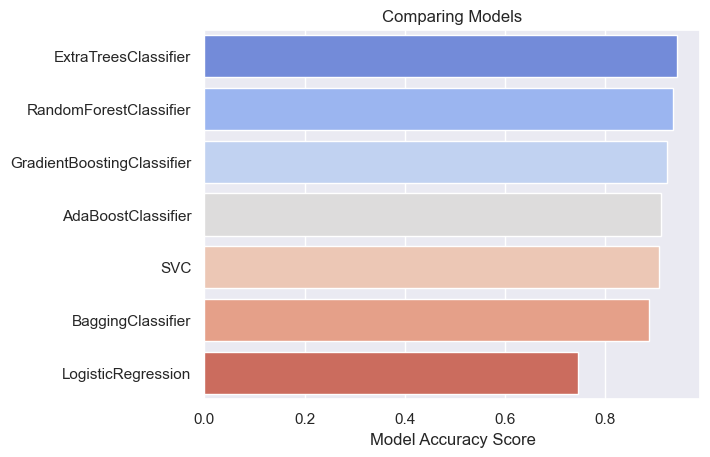

In [201]:
sns.barplot(y= 'id', x= 'Model Accuracy Score', data= df_model_accuracy, palette='coolwarm')
plt.title('Comparing Models')
plt.xlabel('Model Accuracy Score')
plt.ylabel('');

In [202]:
def checking_cvscore(id_model, model, y_pred):
    score = cross_val_score(model, X, Y, cv=5, scoring='accuracy')
    
    score_mean = score.mean()
    diff = accuracy_score(y_test, y_pred) - score_mean
    
    print(f"\n::: Model: {id_model}::: \nscore:{score}")
    print(f"Score mean: {score_mean:.4f}")
    print(f"Difference between Accuracy score and cross validation score is {diff:.4f}")
    return [score_mean, diff]

In [203]:
# Define the new columns for CV metrics
df_model_accuracy['CV score mean'] = np.NaN
df_model_accuracy['Diff Acc and cv score'] = np.NaN
# Setting the id model as index
df_model_accuracy.set_index("id", inplace=True)

In [204]:
# Evaluate cross-validation for each model and save the scores.
for id_model, model in models.items():
    score_mean, diff = checking_cvscore(id_model, model, y_pred[id_model])
    
    df_model_accuracy.loc[id_model, 'CV score mean'] = score_mean
    df_model_accuracy.loc[id_model, 'Diff Acc and cv score'] = diff
    


::: Model: RandomForestClassifier::: 
score:[0.74324324 0.87162162 0.93581081 0.96621622 0.94932432]
Score mean: 0.8932
Difference between Accuracy score and cross validation score is 0.0437

::: Model: ExtraTreesClassifier::: 
score:[0.86486486 0.91216216 0.94594595 0.97635135 0.95945946]
Score mean: 0.9318
Difference between Accuracy score and cross validation score is 0.0119

::: Model: LogisticRegression::: 
score:[0.74662162 0.71959459 0.77027027 0.75337838 0.76689189]
Score mean: 0.7514
Difference between Accuracy score and cross validation score is -0.0059

::: Model: SVC::: 
score:[0.80405405 0.83783784 0.91216216 0.93581081 0.91891892]
Score mean: 0.8818
Difference between Accuracy score and cross validation score is 0.0259

::: Model: GradientBoostingClassifier::: 
score:[0.79054054 0.875      0.92567568 0.9527027  0.93918919]
Score mean: 0.8966
Difference between Accuracy score and cross validation score is 0.0268

::: Model: AdaBoostClassifier::: 
score:[0.72635135 0.82432

In [205]:
# Present the metrics to eval the best model
df_model_accuracy.sort_values(by=['Model Accuracy Score', 'CV score mean','Diff Acc and cv score'], ascending=[False, False, True])

,Model,Training Accuracy,Model Accuracy Score,CV score mean,Diff Acc and cv score
id,,,,,
ExtraTreesClassifier,"(ExtraTreeClassifier(random_state=1529430178),...",1.000000,0.943694,0.931757,0.011937
RandomForestClassifier,"(DecisionTreeClassifier(max_features='sqrt', r...",1.000000,0.936937,0.893243,0.043694
GradientBoostingClassifier,([DecisionTreeRegressor(criterion='friedman_ms...,0.968147,0.923423,0.896622,0.026802
AdaBoostClassifier,"(DecisionTreeClassifier(max_depth=1, random_st...",0.907336,0.912162,0.867568,0.044595
SVC,SVC(),0.961390,0.907658,0.881757,0.025901
BaggingClassifier,(DecisionTreeClassifier(random_state=213597942...,0.995174,0.887387,0.883784,0.003604
LogisticRegression,LogisticRegression(),0.750965,0.745495,0.751351,-0.005856


In [206]:
random_state

113

In [207]:
model = ExtraTreesClassifier()
model.get_params()

{'bootstrap': False,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [208]:
from sklearn.model_selection import RandomizedSearchCV

param_grid = {
             'bootstrap':[True, False],
             'criterion':['gini','entropy'],
             'min_samples_split': np.arange(1, 3),  # Vary the minimum samples required to split
             'min_samples_leaf': np.arange(1, 3),  # Vary the minimum samples required for a leaf
             'n_estimators': np.arange(100, 310, 10),  # Vary the number of trees
             'max_depth': [None] + list(np.arange(80, 110, 10)),  # Vary the maximum depth of trees
             'max_features': ['auto', 'sqrt', 'log2'],
             'random_state': [random_state, 50, 500, 1000],
             'n_jobs': [-1, 0, 1]
             }

# Build the model 
model = ExtraTreesClassifier()

In [209]:
# Perform search with cross validation
# Create RandomizedSearchCV
random_search = RandomizedSearchCV(model, param_distributions=param_grid, 
                                   n_iter=10, scoring='accuracy', cv=3, 
                                   random_state=random_state, n_jobs=-1)
# Fit the model 
random_search.fit(x_train, y_train)

RandomizedSearchCV(cv=3, estimator=ExtraTreesClassifier(), n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [None, 80, 90, 100],
                                        'max_features': ['auto', 'sqrt',
                                                         'log2'],
                                        'min_samples_leaf': array([1, 2]),
                                        'min_samples_split': array([1, 2]),
                                        'n_estimators': array([100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220,
       230, 240, 250, 260, 270, 280, 290, 300]),
                                        'n_jobs': [-1, 0, 1],
                                        'random_state': [113, 50, 500, 1000]},
                   random_state=113, scoring='accuracy')

In [210]:
# Get the best hyperparameters and the best model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

print("Best Parameters for ExtraTreesClassifier model:")
display(best_params)

Best Parameters for ExtraTreesClassifier model:


{'random_state': 500,
 'n_jobs': -1,
 'n_estimators': 250,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 90,
 'criterion': 'entropy',
 'bootstrap': False}

In [211]:
best_model

ExtraTreesClassifier(criterion='entropy', max_depth=90, n_estimators=250,
                     n_jobs=-1, random_state=500)

In [212]:
# Create the model with the best parameters
best_model = ExtraTreesClassifier (criterion = 'gini',
                                   bootstrap = False,
                                   max_depth = 90,
                                   max_features = 'sqrt',
                                   min_samples_split = 2,
                                   min_samples_leaf = 2,
                                   n_estimators = 270,
                                   n_jobs = -1, 
                                   random_state = 500)

best_model.fit(x_train, y_train)
y_pred = best_model.predict(x_test)

# Check the accuracy
acc = accuracy_score(y_test, y_pred)
print(f"accuracy_score: {round(acc*100,2)}%")

accuracy_score: 94.59%


In [213]:
# Create the model with the best parameters
best_model = ExtraTreesClassifier (criterion = 'gini',
                                   bootstrap = False,
                                   max_depth = 90,
                                   max_features = 'sqrt',
                                   min_samples_split = 2,
                                   min_samples_leaf = 1,
                                   n_estimators = 270,
                                   n_jobs = -1, 
                                   random_state = 500)

best_model.fit(x_train, y_train)
y_pred = best_model.predict(x_test)

# Check the accuracy
acc = accuracy_score(y_test, y_pred)
print(f"accuracy_score: {round(acc*100,2)}%")


accuracy_score: 94.59%


In [214]:
models

{'RandomForestClassifier': RandomForestClassifier(),
 'ExtraTreesClassifier': ExtraTreesClassifier(),
 'LogisticRegression': LogisticRegression(),
 'SVC': SVC(),
 'GradientBoostingClassifier': GradientBoostingClassifier(),
 'AdaBoostClassifier': AdaBoostClassifier(),
 'BaggingClassifier': BaggingClassifier()}

In [216]:
# Prediction
prediction = best_model.predict(x_test)

# Accuracy score of the prediction with the model selected
print(f"Accuracy score: {accuracy_score(y_test, prediction)*100:.3f} %")

# Dataframe to compare the predicted values vs the original values
df_result = pd.DataFrame()
df_result['Predicted'] = prediction
df_result['Original'] = np.array(y_test)
df_result.T

Accuracy score: 94.595 %


,0,1,2,3,4,5,6,7,8,9,...,434,435,436,437,438,439,440,441,442,443
Predicted,1,0,1,0,0,1,1,0,0,0,...,1,1,1,1,0,0,0,0,1,1
Original,1,0,1,0,0,1,1,0,0,0,...,1,1,1,0,0,0,0,0,1,1


The given dataset comprises 999 rows and 39 columns; however, our univariate/bivariate analysis was conducted on only 36 features. Columns such as 'policy_number,' 'incident_location,' and 'insured_zip' were dropped as they serve only for identification purposes and do not contribute value to the prediction model.

The target variable was 'fraud_reported,' a categorical variable (Y/N). Consequently, we developed a classification prediction model for its prediction.

The best-performing model was the ExtraTreesClassifier, achieving an accuracy score of 94.37%.

To mitigate multicollinearity issues, two columns, 'injury_claim' and 'total_claim_amount,' were dropped.